# Model results inspection

前面已經完成多個gantry model的cross validation  
這個notebook主軸是想要看看通過我們挑選出的最佳方法下，每個gantry model在實際預測上狀況如何
這邊不做指標的探討，純看不同時間段、節日下的表現   
以下在每個gantry之前，會先檢視一下當初放進去作用的特徵有哪些(有的可能有考慮到車禍有的可能沒有)

# lib

In [1]:
import pandas as pd
import numpy as np
import os
from utilsforecast.evaluation import evaluate
from utilsforecast.plotting import plot_series
from utilsforecast.losses import mse, mae, rmse, smape
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
os.environ['NIXTLA_ID_AS_COL'] = '1'

import sys

# 將 hwttp 資料夾加入 Python 搜尋路徑
sys.path.append(os.path.abspath('..'))
import hwttp.visualization as viz

這邊使用我預先用matplotlib封裝好的幾個視覺化function  
封裝的理由是希望能一致化每次繪圖的成果  
裡面有幾個重點 像是自動根據輸入日期範圍來決定x軸上的刻度  
讓閱讀時相對清爽  
再來是因應事故還有節假日，能有一個相對好的方式來解讀    

# Load data

這是訓練完畢後我們在前面就確認的最好成果，因為分散在不同檔案下，要透過比較麻煩的方式撈出來  

## cv results

In [2]:
# 以下先整理之前我們在比較多變量的結果下最好的組合
output_data_dict = {
    "05F0001N-03F0150N": "../outputs/best/PatchTST-base.csv",
    "05F0001N-03F0201S": "../outputs/best/05F0001N-03F0201S-TSMixerx.csv",
    "05F0055N-05F0001N": "../outputs/best/05F0055N-05F0001N-TSMixerx.csv",
    "05F0287N-05F0055N": "../outputs/best/05F0287N-05F0055N-TSMixerx.csv",
    "05F0309N-05F0287N": "../outputs/best/TSMixerx-base.csv",
    "05F0438N-05F0309N": "../outputs/best/TSMixerx-base.csv",
    "05F0438N-05FR143N": "../outputs/best/05F0438N-05FR143N-TSMixerx.csv",
    "05F0528N-05F0438N": "../outputs/best/PatchTST-base.csv"
}

# 暫時沒有用到，但是後面方便我們確認他是哪種模型
model_name_dict = {
    "05F0001N-03F0150N": "PatchTST",
    "05F0001N-03F0201S": "multivar-TSMixerx",
    "05F0055N-05F0001N": "multivar-TSMixerx",
    "05F0287N-05F0055N": "multivar-TSMixerx",
    "05F0309N-05F0287N": "TSMixerx",
    "05F0438N-05F0309N": "TSMixerx",
    "05F0438N-05FR143N": "multivar-TSMixerx",
    "05F0528N-05F0438N": "PatchTST"
}

# 逐一讀取資料，先儲存於results中
results = dict()
ta_cols = ['unique_id', 'ds', 'cutoff', 'TSMixerx', 'y', 'PatchTST']

for gantrypair_name, path in output_data_dict.items():
    temp_df = pd.read_csv(path)
    condi1 = temp_df.unique_id==gantrypair_name
    temp_df = temp_df[condi1].copy()
    condi2 = [key for key in temp_df.keys() if key in ta_cols]
    temp_df = temp_df[condi2].copy()
    results[gantrypair_name] = temp_df

這是原始全部的資訊，我們需要這邊來鑽研後續部分因子對旅行時間影響是否有被成功納入

## features info

In [3]:
# 定義基礎資料夾路徑與文件的通用後綴
base_folder = '../data/features/all_features_by_intergrantry/'
file_suffix = '_b_p_c_h_t_r.parquet'

# 定義所有需要加載的文件前綴
prefixes = [
    '05F0001N-03F0150N',
    '05F0001N-03F0201S',
    '05F0055N-05F0001N',
    '05F0287N-05F0055N',
    '05F0309N-05F0287N',
    '05F0438N-05F0309N',
    '05F0438N-05FR143N',
    '05F0528N-05F0438N'
]

# 利用字典推導式來加載所有 parquet 文件並存入 all_feature_dfs 字典
all_feature_dfs = {prefix: pd.read_parquet(f"{base_folder}{prefix}{file_suffix}") 
                   for prefix in prefixes}


In [4]:
for i, v in all_feature_dfs.items():
    print(v.shape)

(35040, 62)
(35040, 62)
(35040, 62)
(35040, 62)
(35040, 62)
(35040, 62)
(35040, 62)
(35040, 62)


In [5]:
f_results = dict()
for gantry_name, result_df in results.items():
    result_df['ds'] = pd.to_datetime(result_df['ds'])
    f_results[gantry_name] = result_df.merge(all_feature_dfs[gantry_name],
                                             left_on='ds',
                                             right_on='TimeStamp',
                                             how='left')
    print(f'gantry_name = {gantry_name}')
    print(f'predict_df_shape = {result_df.shape}')
    print(f'feature_df_shape = {all_feature_dfs[gantry_name].shape}')
    print(f'final___df_shape = {f_results[gantry_name].shape}')


gantry_name = 05F0001N-03F0150N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0001N-03F0201S
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0055N-05F0001N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0287N-05F0055N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0309N-05F0287N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0438N-05F0309N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0438N-05FR143N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)
gantry_name = 05F0528N-05F0438N
predict_df_shape = (33600, 5)
feature_df_shape = (35040, 62)
final___df_shape = (33600, 67)


## feature importance info

In [6]:
# 通用的資料夾路徑與文件名前綴
base_folder = '../data/features/feature_selection_results/'

# 定義所有需要加載的文件前綴
prefixes = [
    '05F0001N-03F0150N',
    '05F0001N-03F0201S',
    '05F0055N-05F0001N',
    '05F0287N-05F0055N',
    '05F0309N-05F0287N',
    '05F0438N-05F0309N',
    '05F0438N-05FR143N',
    '05F0528N-05F0438N'
]

file_suffix = '_b_p_c_h_t_r.csv'

# 利用字典推導式來加載所有 parquet 文件並存入 all_feature_dfs 字典
feature_importance = {prefix: pd.read_csv(f"{base_folder}{prefix}{file_suffix}") for prefix in prefixes}

# 沿用前一次選定的門檻
threshold = 0.00005

for id, df in feature_importance.items():
    feature_importance[id] = df[df['importance'] > threshold].copy()

# Customized function

這邊寫一個簡單的function讓我們可以快速地抓一下發生車禍的日期，一定程度上可以檢驗那些有考慮到車禍因素的模型表現如何

特殊找車禍時間點

In [7]:
def get_accident_datetime(df: pd.DataFrame) -> pd.DataFrame:
    '''
    這只是一個快速看發生事故的日期用途，方便我們來檢視發生事故的時間範圍
    '''
    check_df = df.copy()
    check_df['datetime'] = check_df['ds'].dt.date
    display(check_df[check_df.accident_type.isin([1,2,3])].groupby(['datetime', 'accident_type'])['ds'].count().reset_index())
    return None

另外一個function讓我們後面快速確認濾除特殊狀況(holiday, road_build, accident)等，盡可能只看正常狀況下的旅行時間預測  
但有個例外，如果下游有發生車禍的話，當前的gantry資料中是沒有標註的

In [8]:
def remove_special_condi(df: pd.DataFrame) -> pd.DataFrame:
    print(f'original data shape = {df.shape}')
    condi_1 = df.holiday_length == 0
    print(f'remove only holiday data shape = {df[condi_1].shape}')
    condi_2 = df.road_build == 0
    print(f'remove only road build data shape = {df[condi_2].shape}')
    condi_3 = df.accident_type == 0
    print(f'remove only traffic accident data shape = {df[condi_3].shape}')
    print(f'remove above condition to gain normal data shape = {df[condi_1 & condi_2 &condi_3].shape}')
    
    filter_df = df[condi_1 & condi_2 &condi_3].copy()
    return filter_df

In [9]:
def get_congestion_time(df: pd.DataFrame) -> pd.DataFrame:
    check_df = df[df.congestion_syndrome==1].copy()
    display(check_df.groupby(['dayofweek'])['ds'].count())

# Visualization


在繪圖的設計上，周末是用axvspan畫上黃底  
特殊節日畫上紅底  
官方標註的壅塞時間則是用灰色代表  
道路施工時間則是用灰色底加上斜線作為代表  
axvspan還可以設計透明度，因此色系有機會疊加  
  
交通事故的狀況則依據A1~A3分別用幾個符號代表 概念設計上是希望在視覺化的閱讀上能讓用戶更快理解  

# 05F0001N-03F0150N-PatchTST

In [10]:
gantry_name = '05F0001N-03F0150N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,dayofweek,0.610277
1,holiday_length,0.132508
2,holiday_name_萬聖節,0.090272
3,holiday_name_七夕情人節,0.035597
4,holiday_name_西洋情人節,0.028306
5,holiday_continue,0.028191
6,holiday_name_農曆新年,0.014103
7,holiday_name_國慶日,0.011962
8,holiday_name_二二八紀念日,0.011498
9,holiday_name_跨年元旦,0.008412


使用PatchTST模型進行訓練，雖然在特徵篩選時有20個特徵被納入考量，僅考慮了節假日的因子  
我們在後續比拚模型好壞時發現應用PatchTST這個單變量的時間序列神經網路模型就可以達到最好的效果  

## normal days

In [11]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (33600, 67)
remove only traffic accident data shape = (33600, 67)
remove above condition to gain normal data shape = (29376, 67)


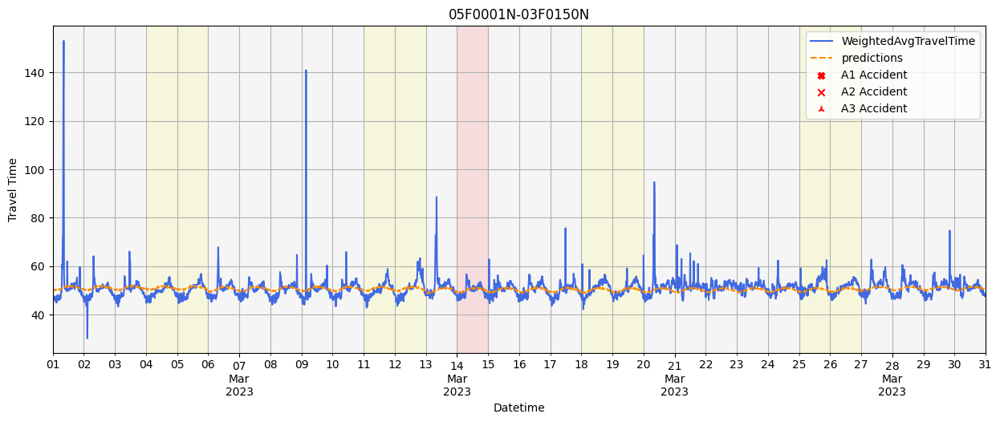

In [12]:
# March
viz.plot_pred(df, 'PatchTST', '2023-03-01', '2023-03-31')

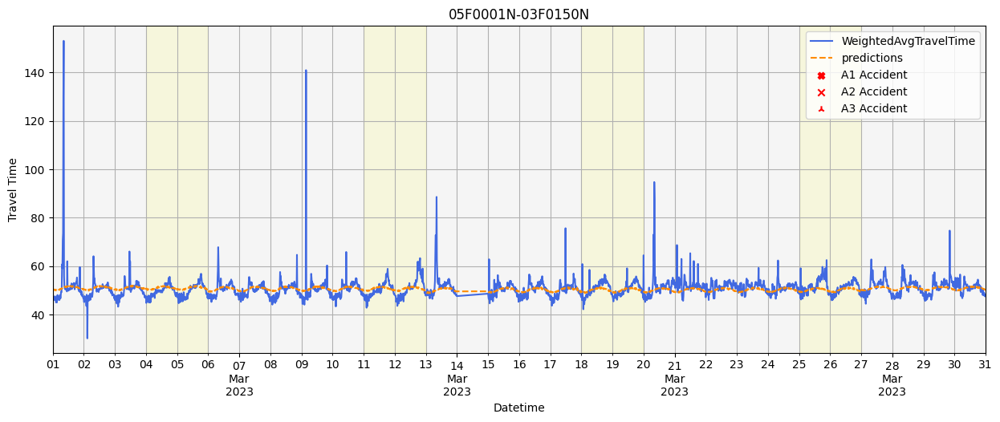

In [13]:
# March, normal condition only
viz.plot_pred(filter_df, 'PatchTST', '2023-03-01', '2023-03-31')

從三月的結果來看，模型捕捉到的趨勢是相對平滑的，不太能體現週間波動上下震盪的幅度  
但往下看後續的月份會發現模型在學習上應該是成功精進了預測的能力，上下震盪幅度更能掌握  
部分異常值偏高，大概會是因為下游可能為匝道口，回堵造成，但當前的資訊中沒有這塊訊息

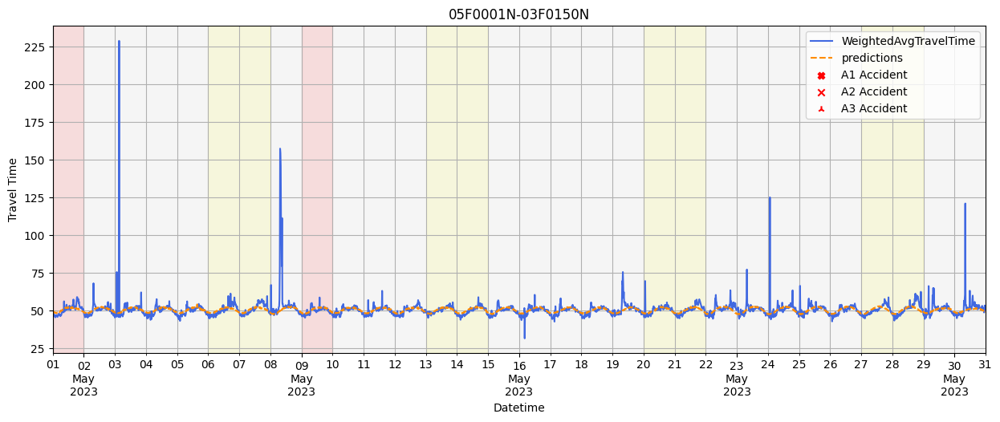

In [14]:
viz.plot_pred(df, 'PatchTST', '2023-05-01', '2023-05-31')

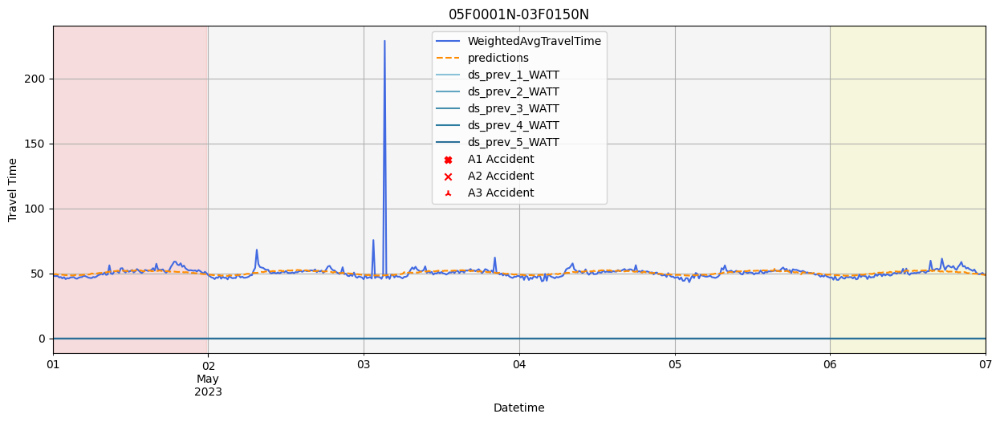

In [15]:
viz.plot_pred(df, 'PatchTST', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

無下游路段，因此參考的特徵相對少

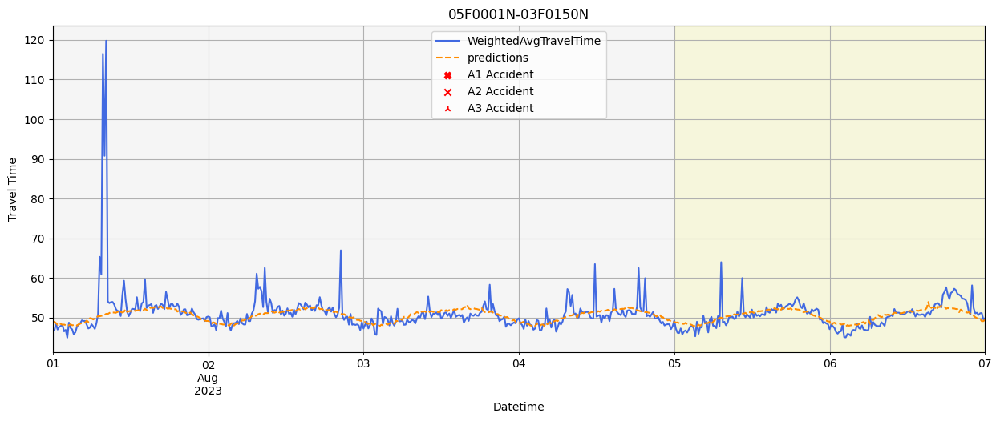

In [16]:
viz.plot_pred(df, 'PatchTST', '2023-08-01', '2023-08-07')

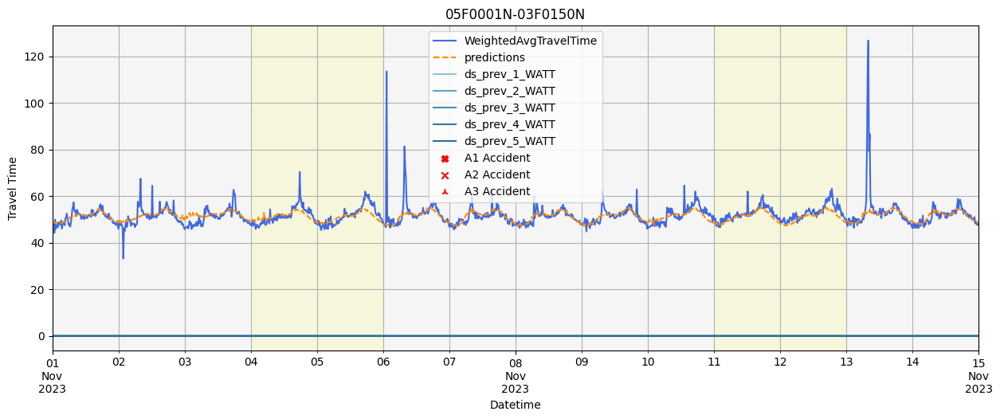

In [17]:
viz.plot_pred(df, 'PatchTST' ,'2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [18]:
get_congestion_time(df)

Series([], Name: ds, dtype: int64)

## holiday

節假日表現尚可

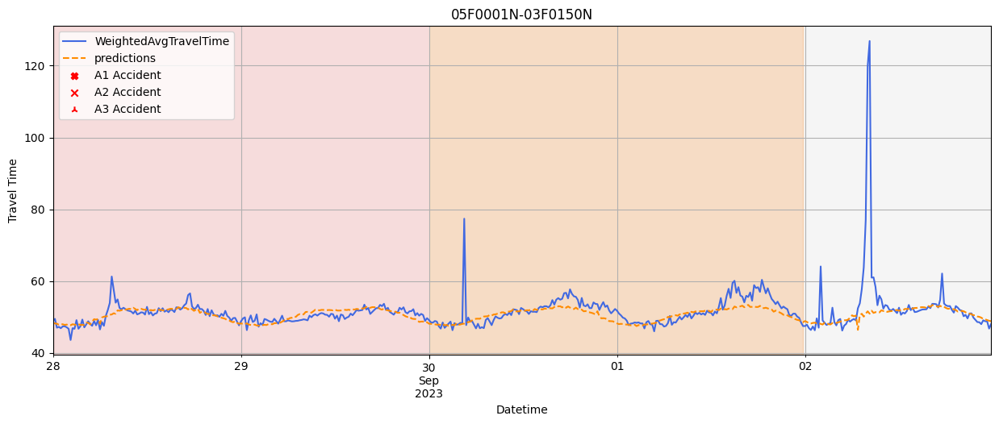

In [19]:
viz.plot_check_holiday(df, 'PatchTST', '中秋節', ext_time=1)

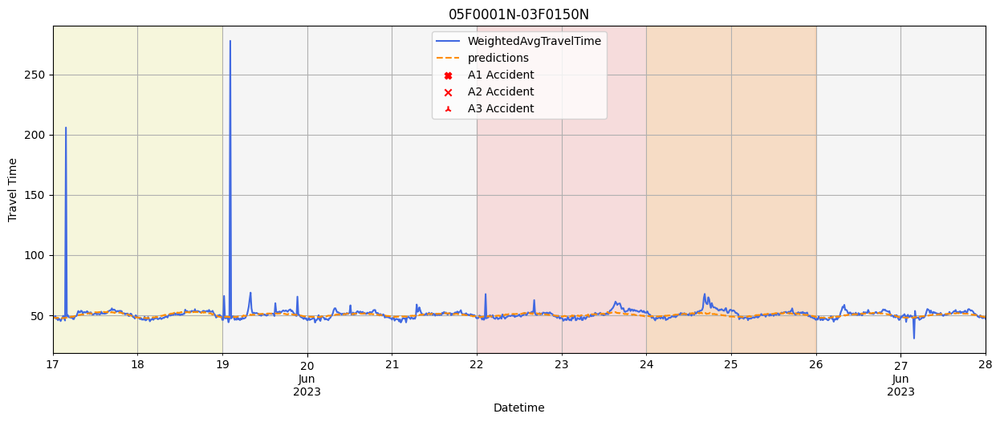

In [20]:
viz.plot_pred(df, 'PatchTST', '2023-06-17', '2023-06-28')

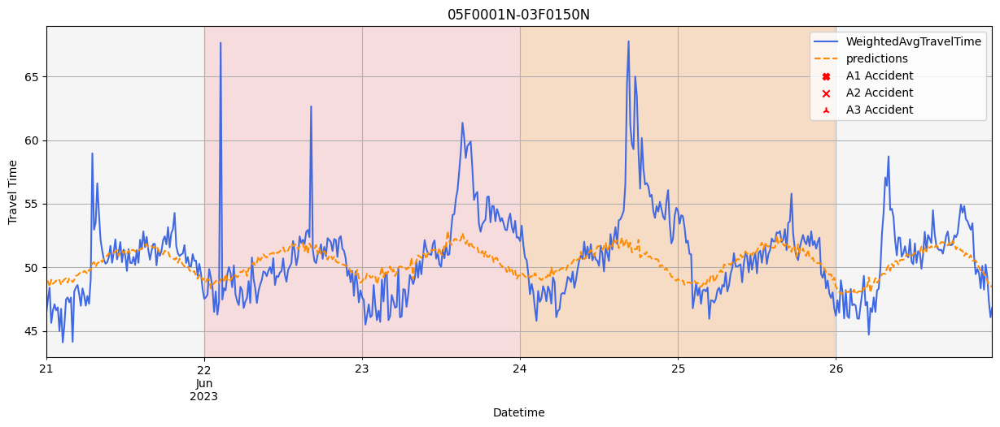

In [21]:
viz.plot_check_holiday(df, 'PatchTST', '端午節', ext_time=1)

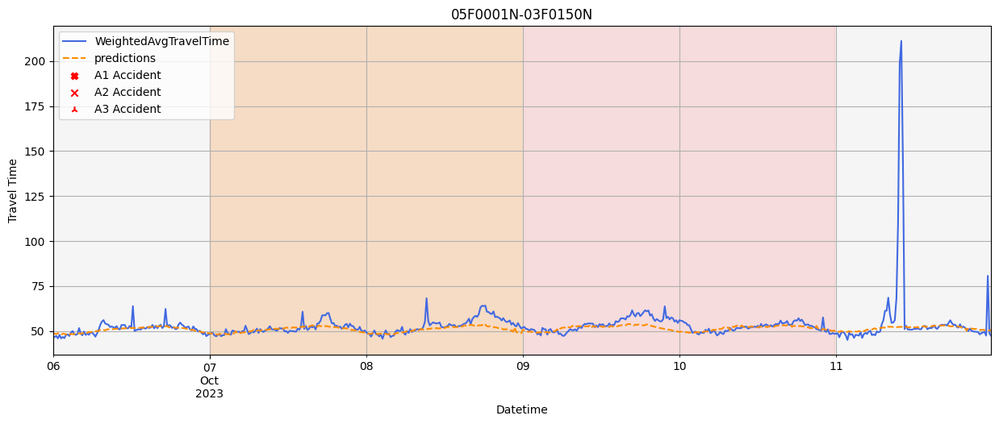

In [22]:
viz.plot_check_holiday(df, 'PatchTST', '國慶日', ext_time=1)

## traffic event

In [23]:
get_accident_datetime(df)

,datetime,accident_type,ds


# 05F0001N-03F0201S-multivar-TSMixerx

In [24]:
gantry_name = '05F0001N-03F0201S'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,dayofweek,0.636347
1,holiday_length,0.207830
2,holiday_continue,0.122040
3,holiday_name_七夕情人節,0.009345
4,holiday_name_跨年元旦,0.007429
5,holiday_name_西洋情人節,0.002793
6,holiday_name_母親節,0.002370
7,holiday_name_中秋節,0.002101
8,holiday_name_教師節,0.001563
9,holiday_name_端午節,0.001469


使用多變量版本的TSMixerx模型進行訓練，20個特徵通過門檻，在特徵重要性僅考慮了節假日的因子   
在實際建模上是有額外使用這些因子做為參考  

## normal days

In [25]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (33600, 67)
remove only traffic accident data shape = (33600, 67)
remove above condition to gain normal data shape = (29376, 67)


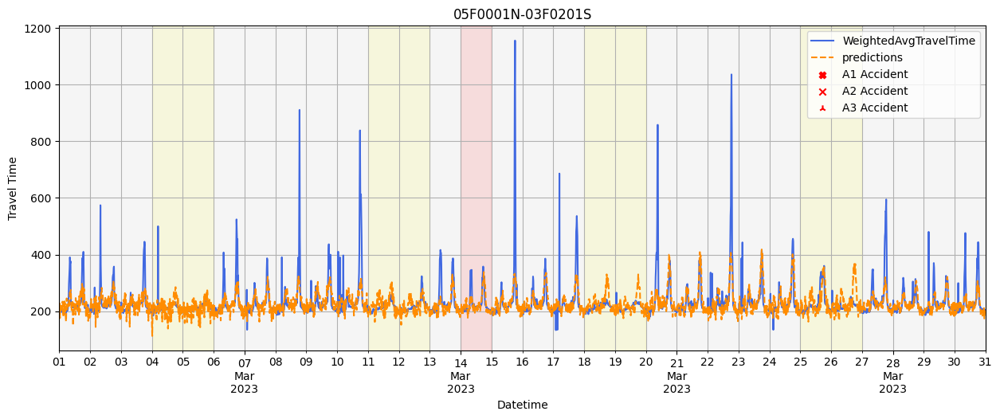

In [26]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

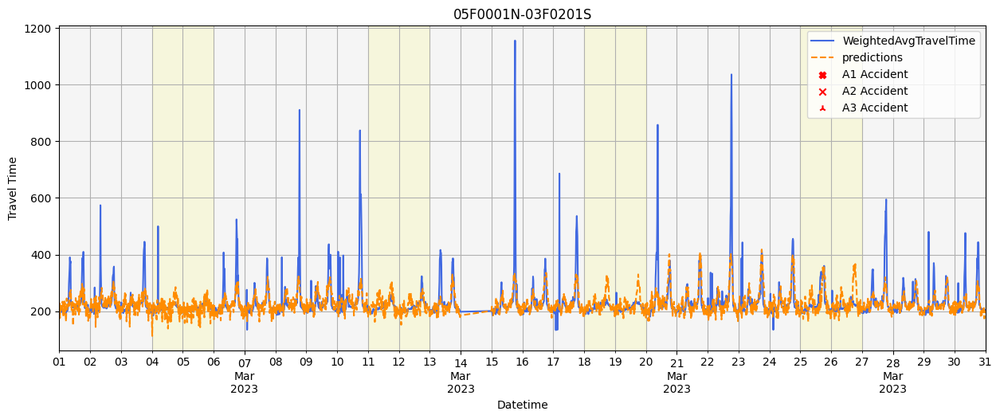

In [27]:
# March, normal condition only
viz.plot_pred(filter_df, 'TSMixerx', '2023-03-01', '2023-03-31')

從三月的結果來看，模型捕捉到的趨勢還滿符合的

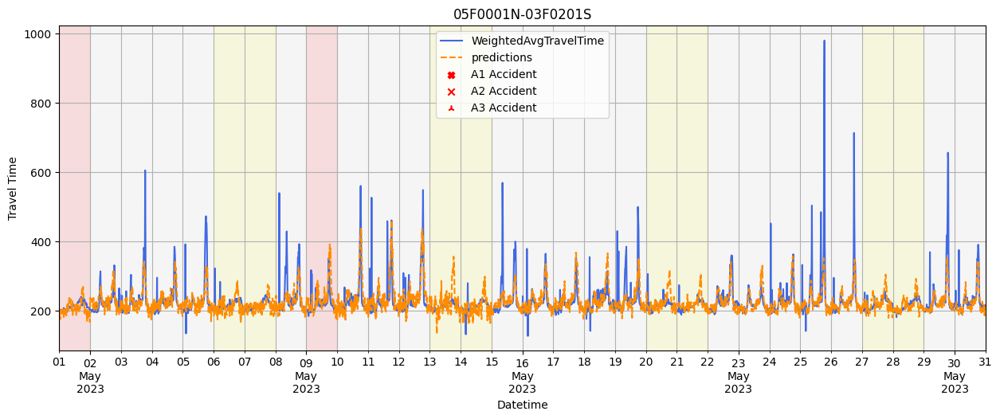

In [28]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-31')

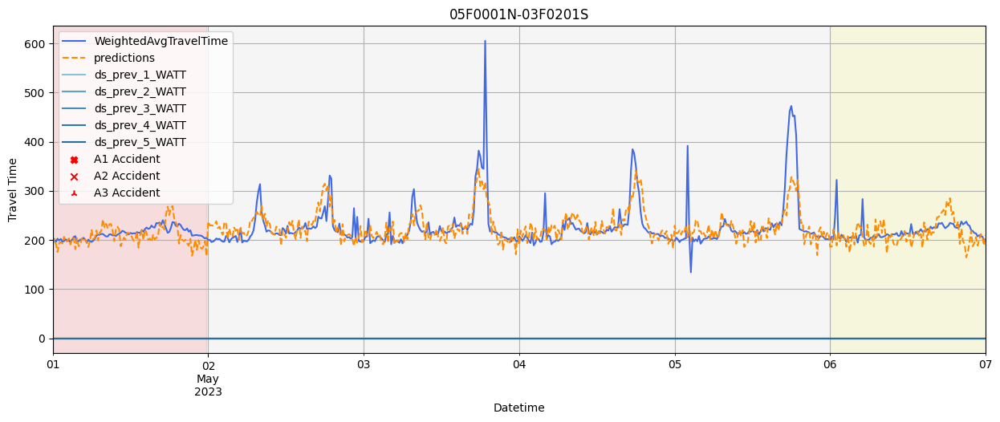

In [29]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

無下游路段，因此參考的特徵相對少

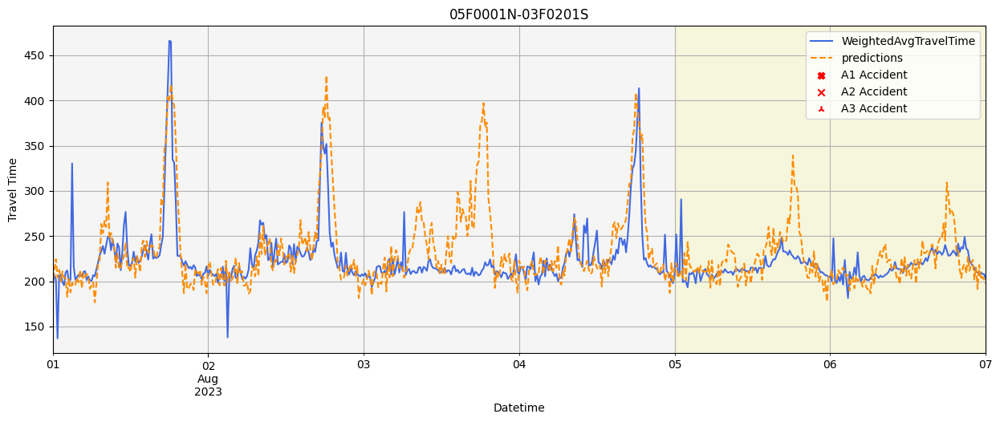

In [30]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

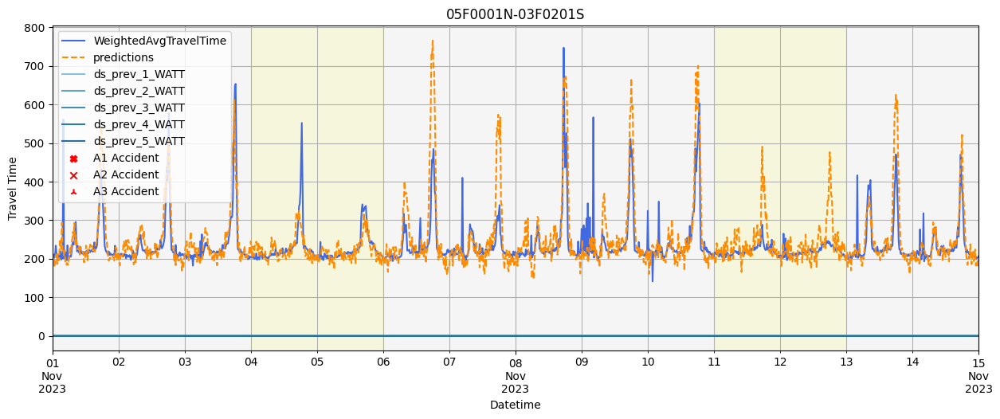

In [31]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [32]:
get_congestion_time(df)

Series([], Name: ds, dtype: int64)

## holiday

節假日表現不錯，部分看起來甚至有預防的作用

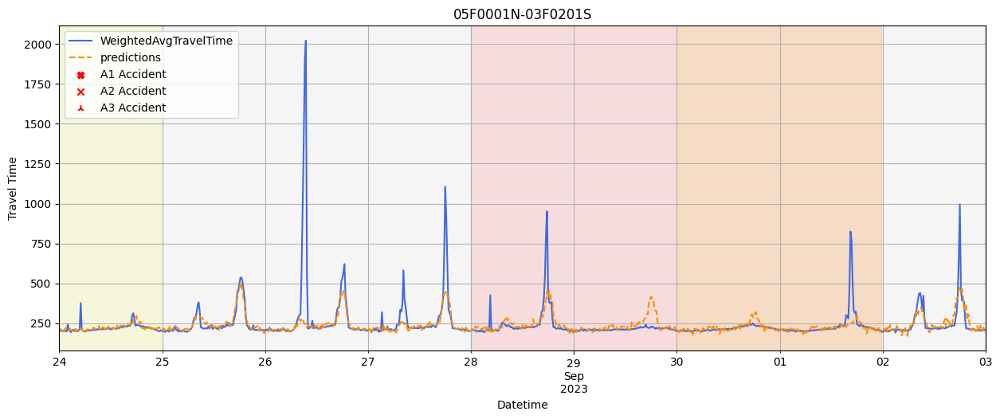

In [33]:
viz.plot_pred(df, 'TSMixerx', '2023-09-24', '2023-10-03')

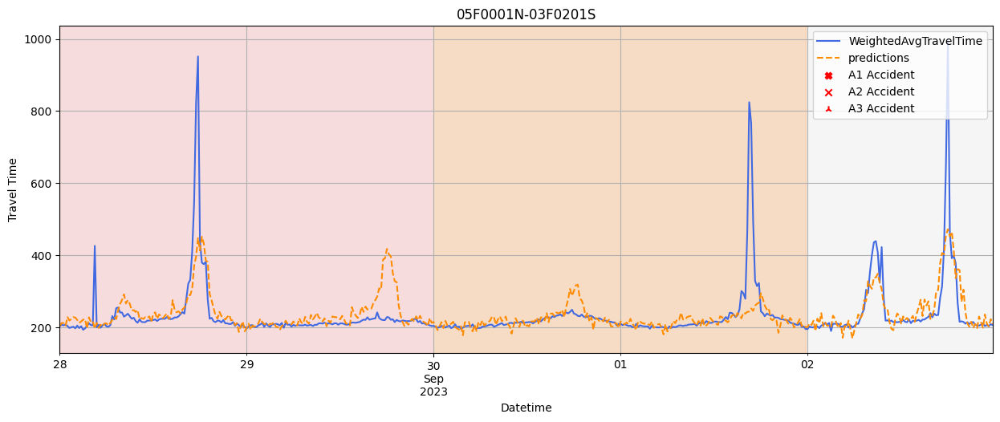

In [34]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

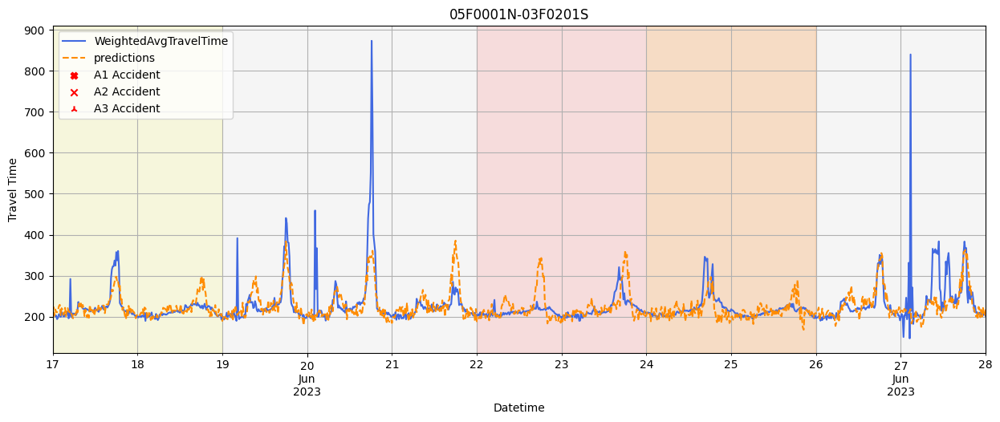

In [35]:
viz.plot_pred(df, 'TSMixerx', '2023-06-17', '2023-06-28')

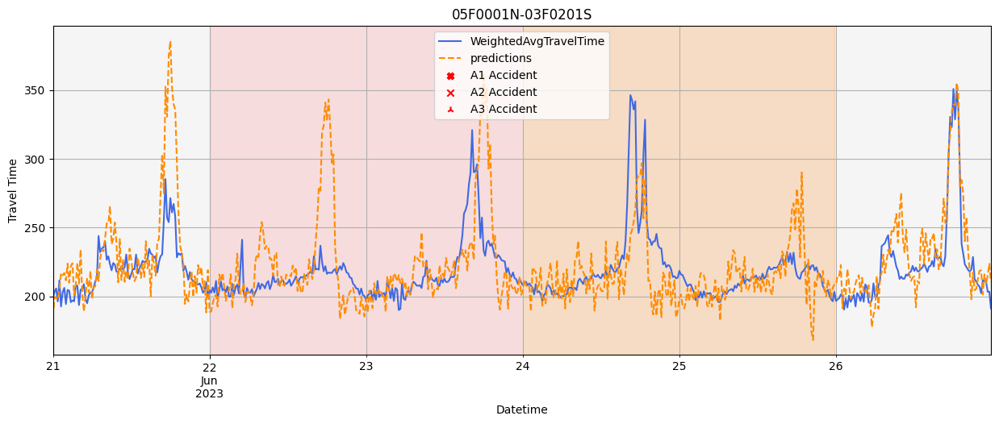

In [36]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

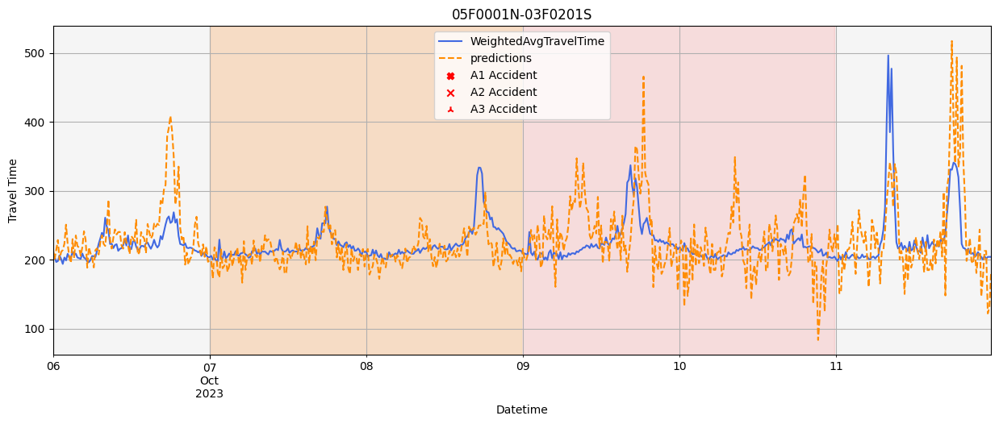

In [37]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

## traffic event

In [38]:
get_accident_datetime(df)

,datetime,accident_type,ds


# 05F0055N-05F0001N-multivar-TSMixerx

In [39]:
gantry_name = '05F0055N-05F0001N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,ds_prev_1_WATT,0.237891
1,ds_prev_2_WATT,0.133297
2,dayofweek,0.131863
3,ds_prev_3_WATT,0.089751
4,ds_prev_5_WATT,0.074736
5,ds_prev_4_WATT,0.074284
6,accident_mileage,0.065582
7,holiday_length,0.045124
8,holiday_continue,0.033793
9,handling_minutes,0.029328


使用多變量的TSMixerx模型進行訓練，33個特徵，在特徵重要性中下游的影響較大，其他的因子影響度都相對小  

## normal days

In [40]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (18069, 67)
remove only traffic accident data shape = (33550, 67)
remove above condition to gain normal data shape = (15144, 67)


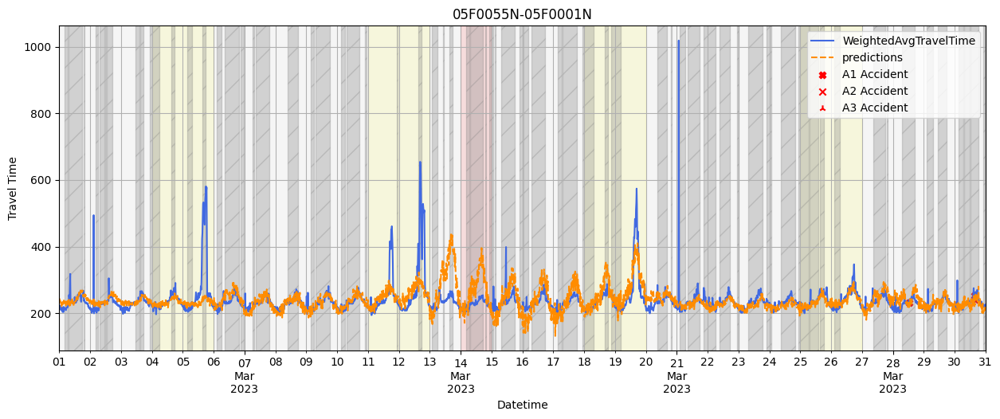

In [41]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

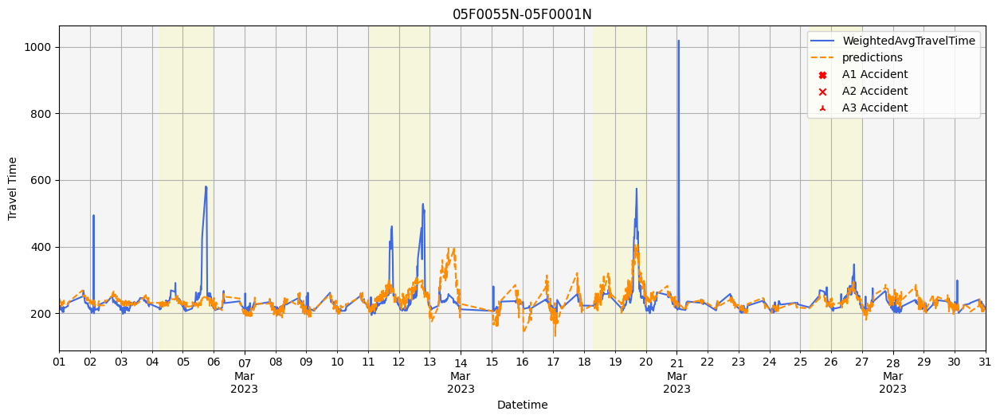

In [42]:
# March, normal condition only
viz.plot_pred(filter_df, 'TSMixerx', '2023-03-01', '2023-03-31')

從三月的結果來看，模型捕捉到的趨勢還滿符合的

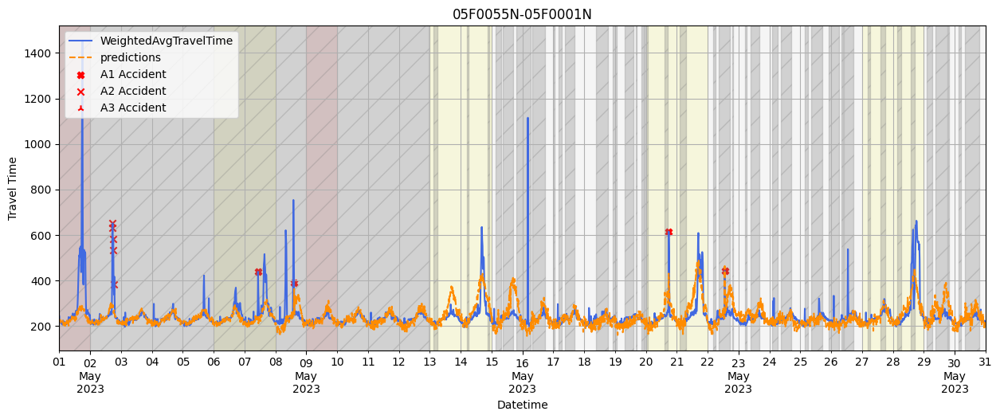

In [43]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-31')

從隨便抽出的時間範圍來看，道路施工頻繁

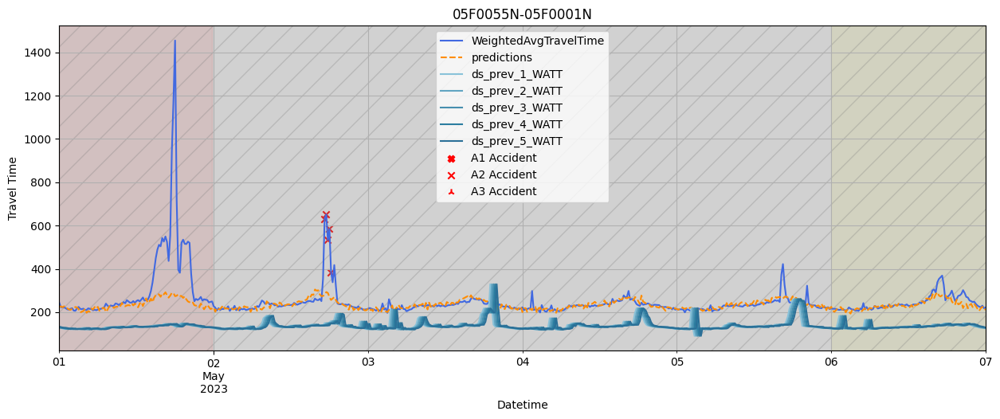

In [44]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

看起來下游路段的旅行時間是對本路段沒有太大的影響

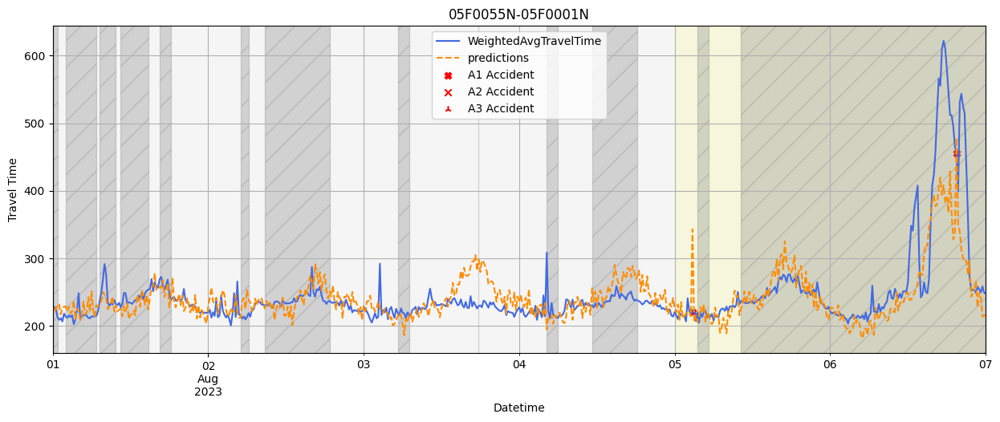

In [45]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

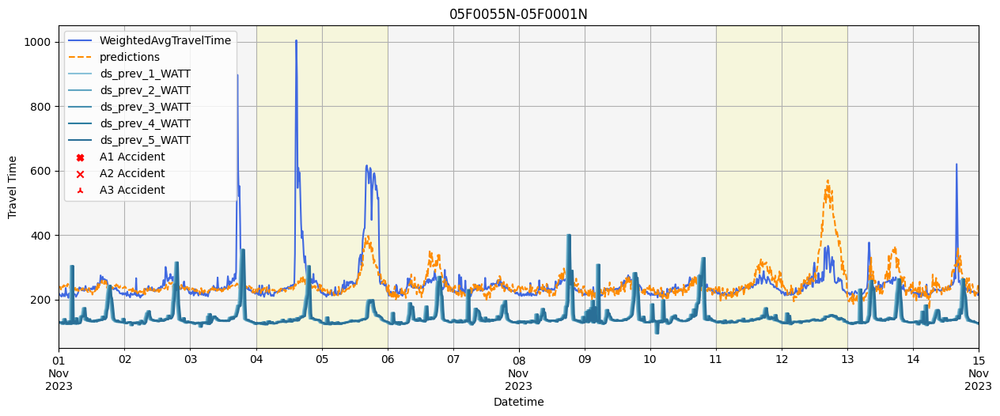

In [46]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True)

一定程度存在旅行時間高峰，初步看不出最大的可能原因是什麼

## congestion

In [47]:
get_congestion_time(df)

Series([], Name: ds, dtype: int64)

## holiday

節假日表現普通

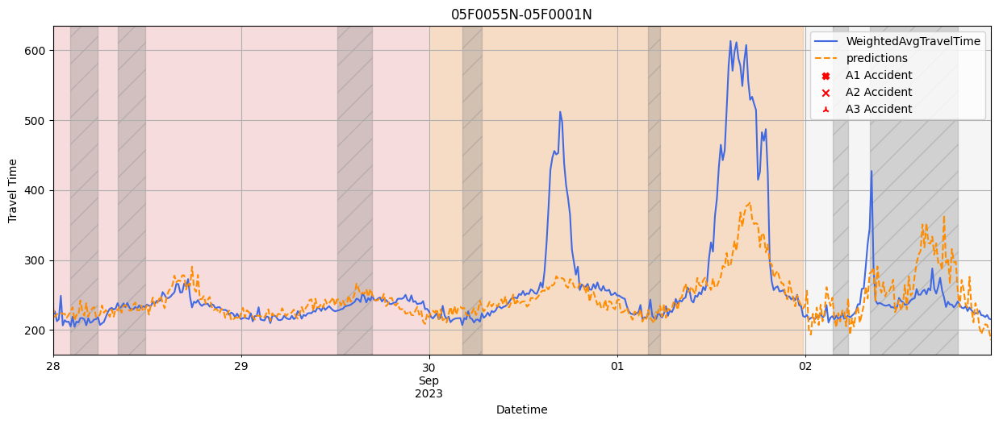

In [48]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

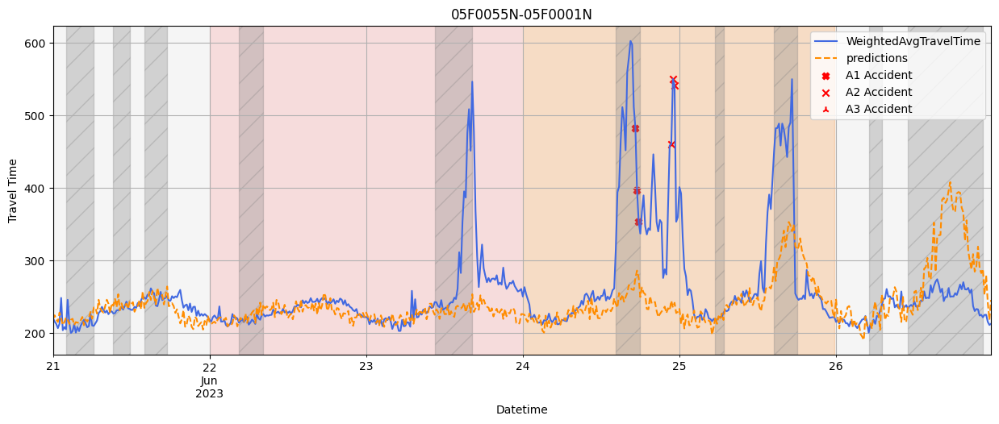

In [49]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

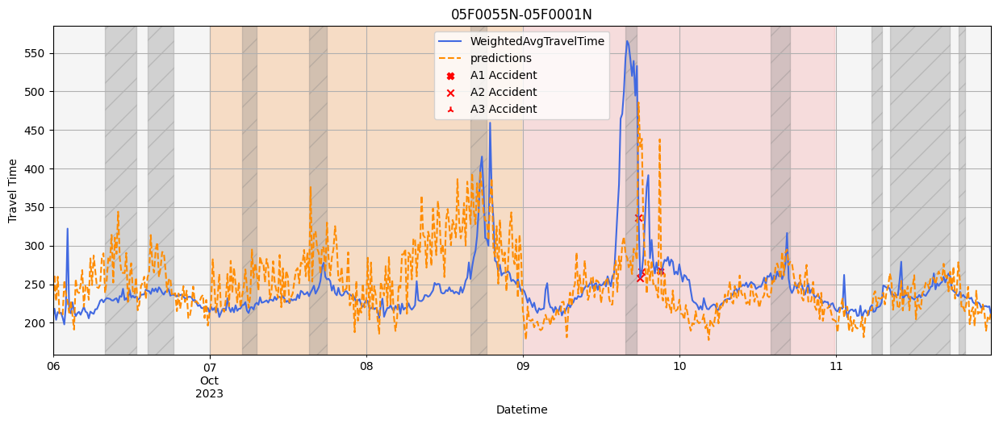

In [50]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

## traffic event

In [51]:
get_accident_datetime(df)

,datetime,accident_type,ds
0,2023-01-16,1,4
1,2023-01-23,1,3
2,2023-02-23,1,2
3,2023-02-27,1,2
4,2023-03-28,1,1
5,2023-03-30,1,2
6,2023-04-15,1,2
7,2023-05-02,2,5
8,2023-05-07,1,1
9,2023-05-08,1,1


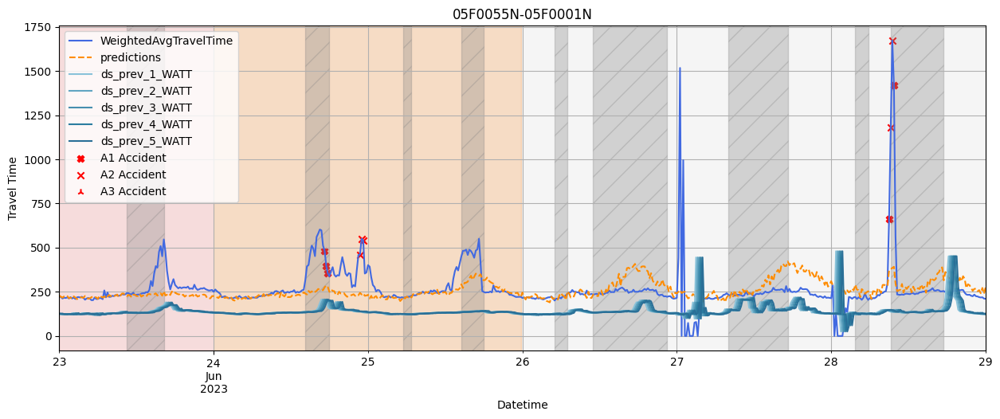

In [52]:
viz.plot_pred(df, 'TSMixerx', '2023-06-23', '2023-06-29', enable_prev=True)

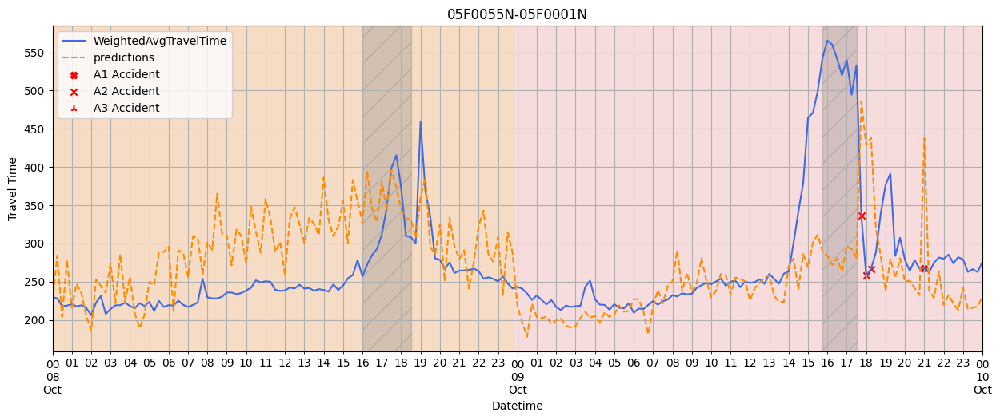

In [53]:
viz.plot_pred(df, 'TSMixerx', '2023-10-08', '2023-10-10')

車禍特徵沒有辦法為模型的預測起到太大的作用

# 05F0287N-05F0055N-multivar-TSMixerx

In [54]:
gantry_name = '05F0287N-05F0055N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,ds_prev_1_WATT,0.702646
1,ds_prev_2_WATT,0.059381
2,ds_prev_4_WATT,0.058235
3,ds_prev_3_WATT,0.055252
4,ds_prev_5_WATT,0.049405
5,dayofweek,0.019389
6,holiday_length,0.011476
7,congestion_syndrome,0.009092
8,holiday_continue,0.005255
9,road_build,0.004984


使用多變量的TSMixerx模型進行訓練，32個特徵，在特徵重要性中下游的影響較大，其他的因子影響度都相對小  

## normal days

In [55]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (16329, 67)
remove only traffic accident data shape = (33516, 67)
remove above condition to gain normal data shape = (13884, 67)


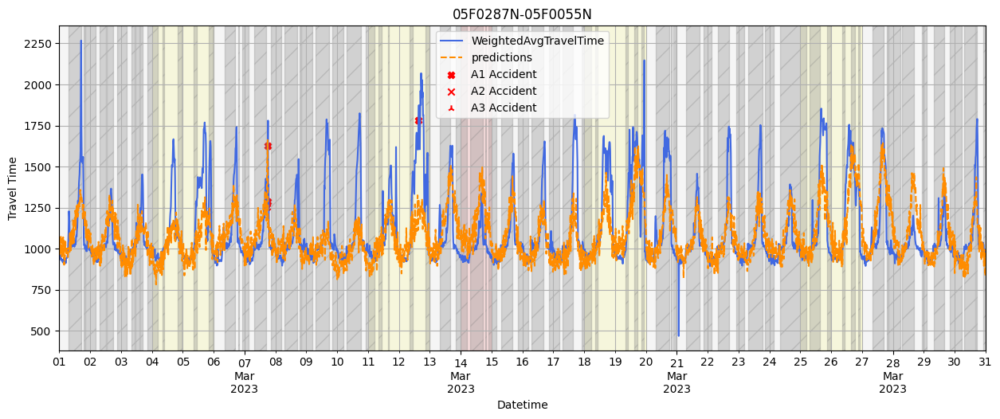

In [56]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

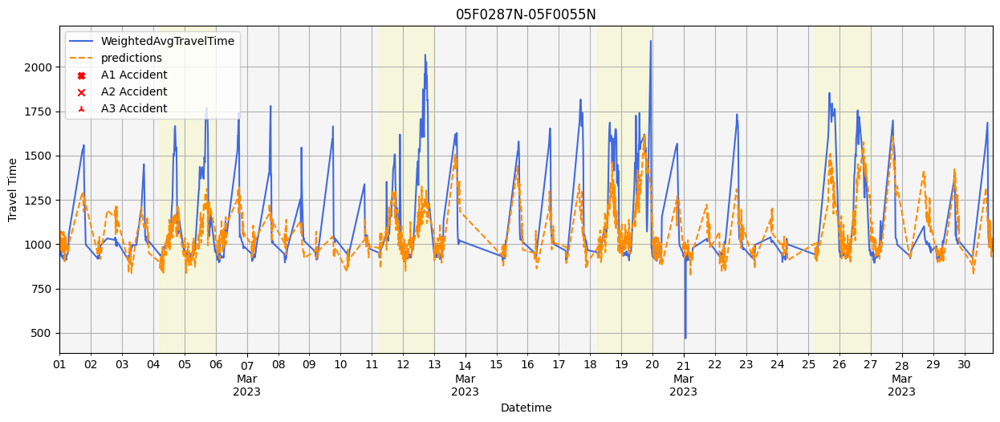

In [57]:
# March, normal condition only
viz.plot_pred(filter_df, 'TSMixerx', '2023-03-01', '2023-03-31')

從三月的結果來看，模型捕捉到的趨勢還滿符合的

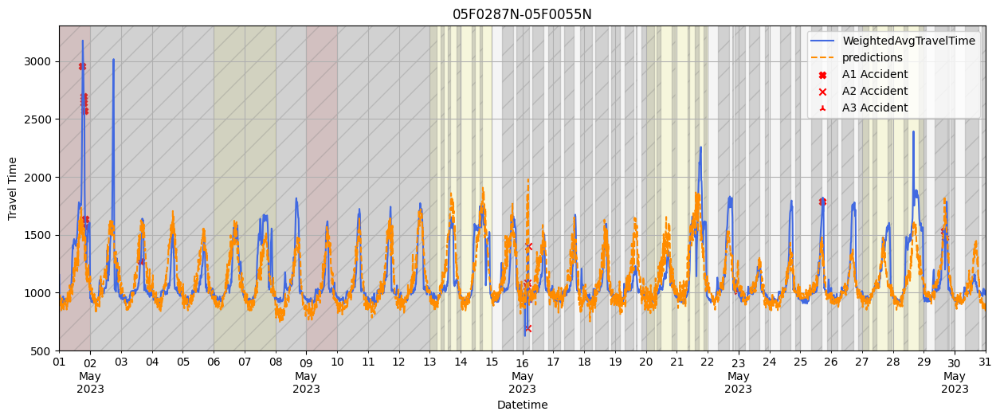

In [58]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-31')

從隨便抽出的時間範圍來看，道路施工挺頻繁的，但與旅行時間變長的狀況不相關

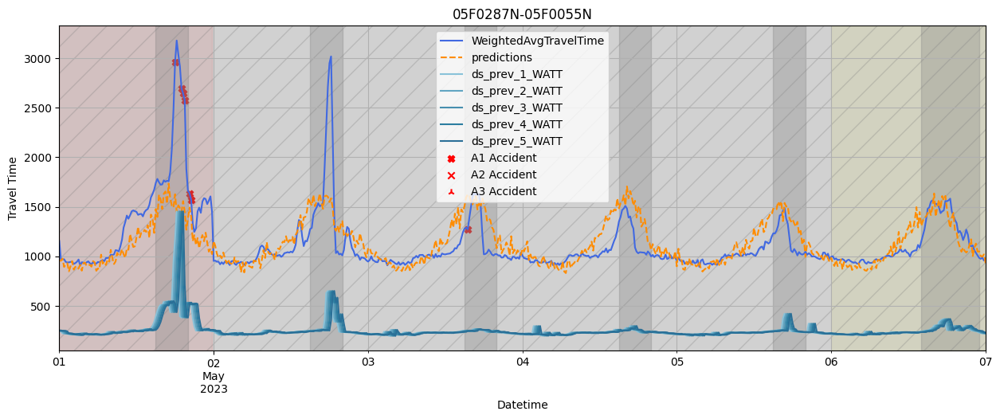

In [59]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

看起來下游路段的旅行時間是對本路段有相當大的影響

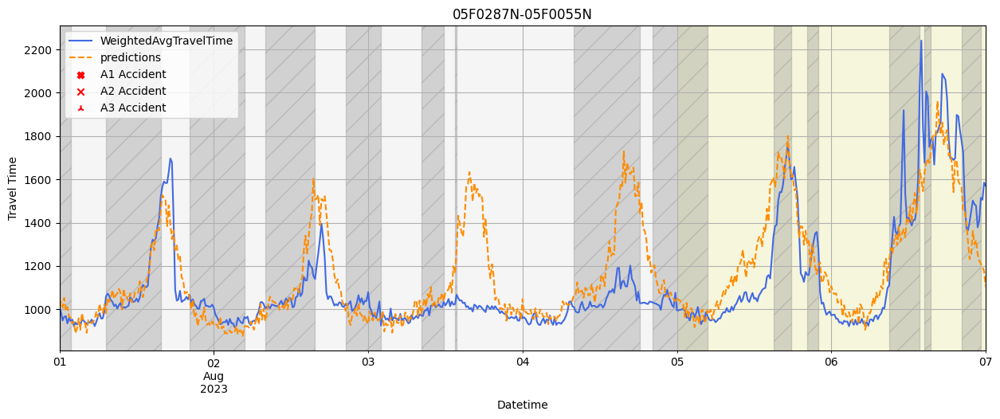

In [60]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

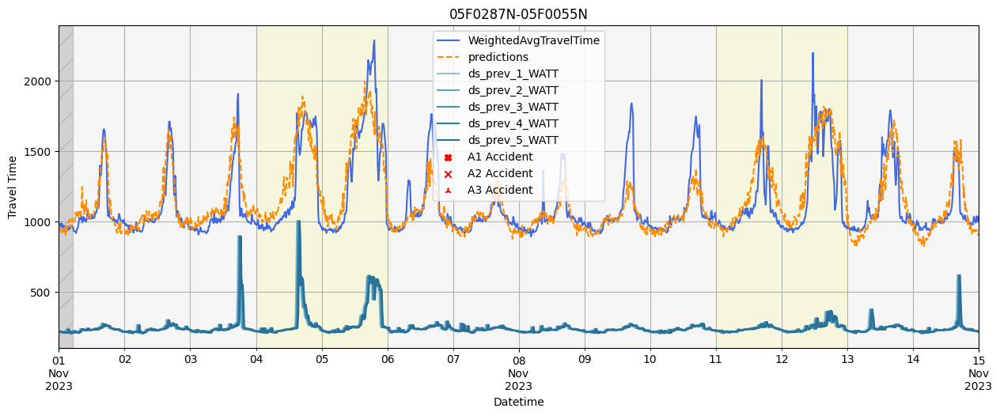

In [61]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [62]:
get_congestion_time(df)

dayofweek
1    1050
2    1050
3    1050
4    1050
5    1050
6    1502
7    2639
Name: ds, dtype: int64

資料中標註到壅塞的觀測，在預測的區間上算是很好的貼合了上升的旅行時間

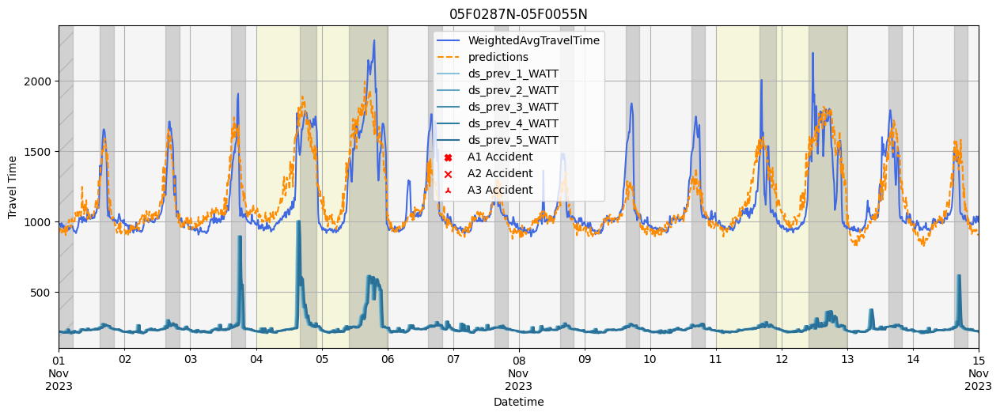

In [63]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True, enable_cong_label=True)

## holiday

節假日看起來也有不錯的表現

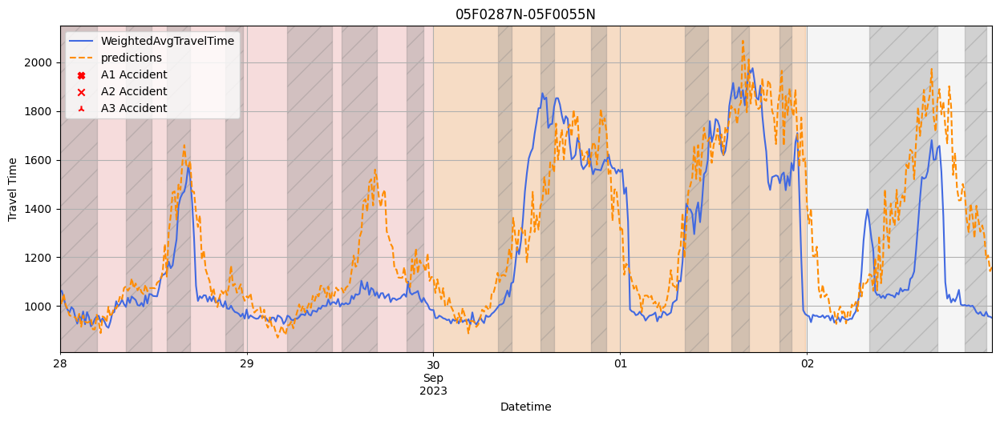

In [64]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

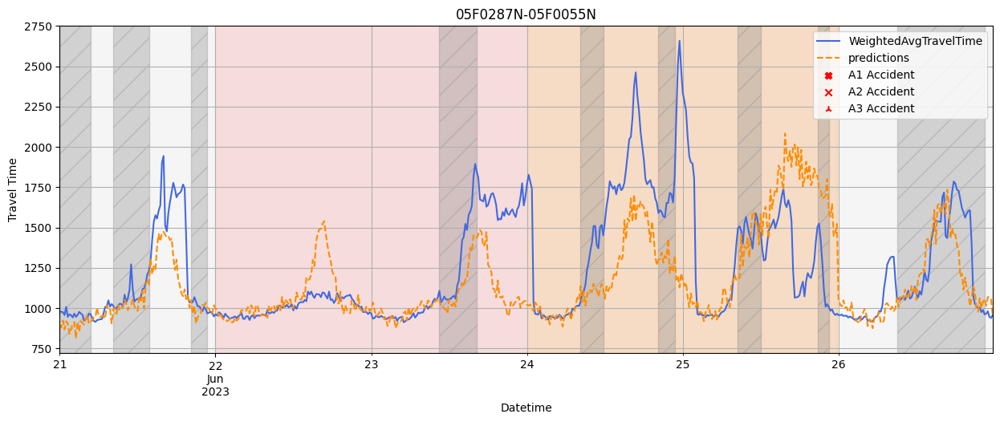

In [65]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

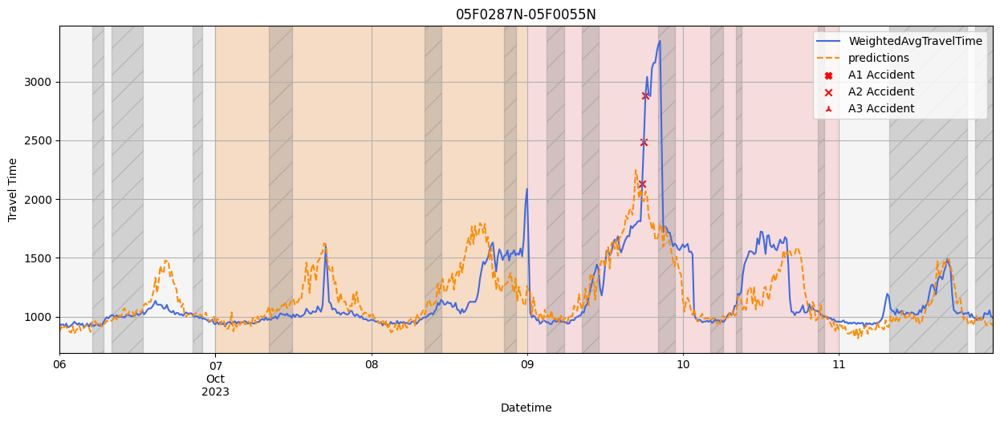

In [66]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

## traffic event

In [67]:
get_accident_datetime(df)

,datetime,accident_type,ds
0,2023-02-12,1,1
1,2023-02-23,1,2
2,2023-02-26,1,1
3,2023-02-27,1,4
4,2023-03-07,1,3
5,2023-03-12,1,1
6,2023-04-06,2,4
7,2023-04-18,1,1
8,2023-04-23,1,3
9,2023-04-28,1,3


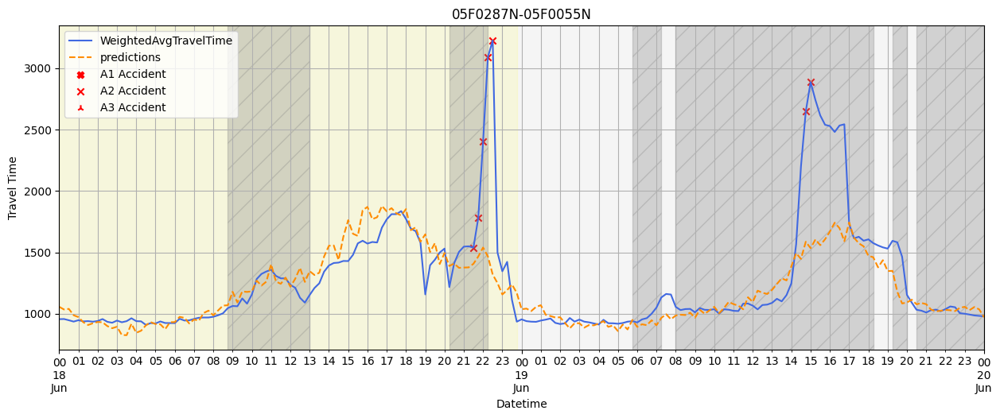

In [68]:
viz.plot_pred(df, 'TSMixerx', '2023-06-18', '2023-06-20')

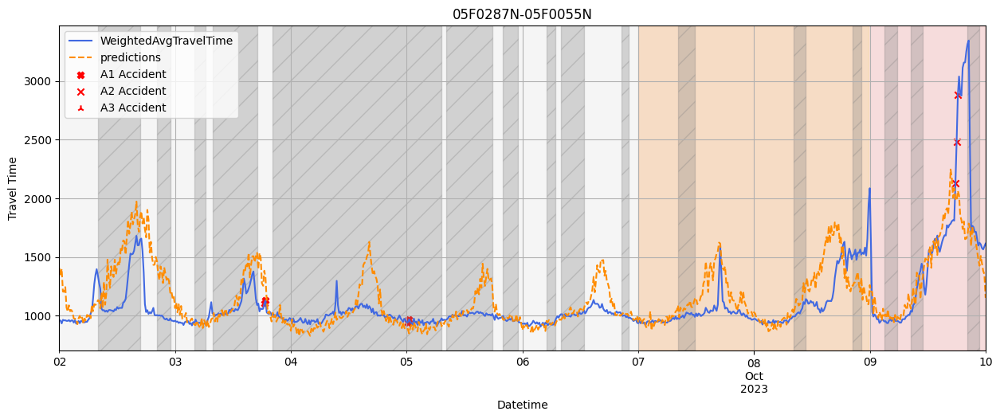

In [69]:
viz.plot_pred(df, 'TSMixerx', '2023-10-02', '2023-10-10')

車禍特徵沒有辦法為模型的預測起到太大的作用

# 05F0309N-05F0287N-TSMixerx

In [70]:
gantry_name = '05F0309N-05F0287N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,ds_prev_1_WATT,0.627046
1,ds_prev_5_WATT,0.069453
2,dayofweek,0.058297
3,ds_prev_2_WATT,0.051365
4,ds_prev_4_WATT,0.047570
5,ds_prev_3_WATT,0.045258
6,holiday_length,0.042592
7,holiday_continue,0.025853
8,congestion_syndrome,0.010617
9,holiday_name_跨年元旦,0.005217


使用TSMixerx模型進行訓練，27個特徵，在特徵重要性中下游的影響較大，後續則是節假日、道路維修以及壅塞的標記，有用到非常少的事故相關特徵  
05F0309N-05F0287N最為顯著的應該還是下游的前15分鐘旅行時間有最強的影響力  
雖然沒有用到多變量的設定，但是此神經網路的設計上應該是可以掌握與前段時間高度相關的趨勢性  

## normal days

In [71]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (25623, 67)
remove only traffic accident data shape = (33578, 67)
remove above condition to gain normal data shape = (21877, 67)


從下圖推估模型訓練結果成效應該很差，光是在三月上的幅度變化就很不一樣了  

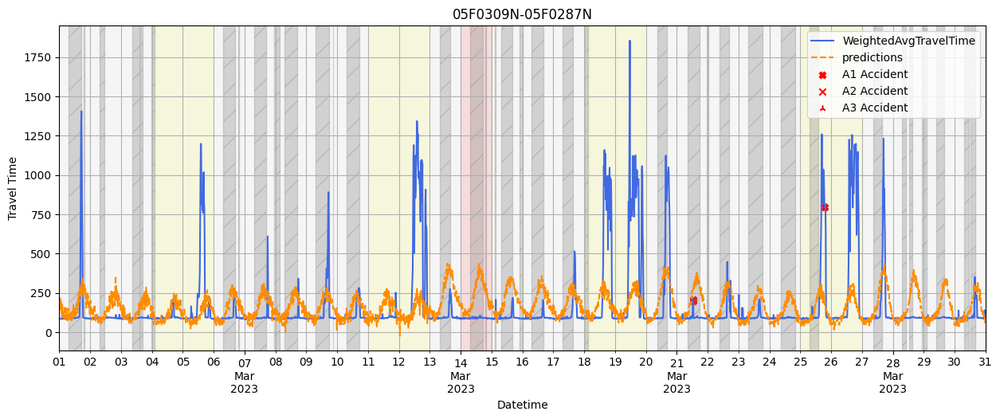

In [72]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

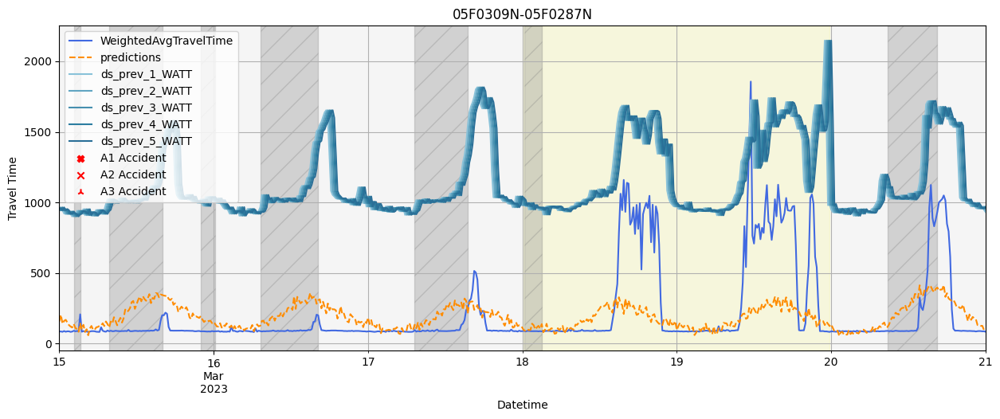

In [73]:
# March, normal condition only
viz.plot_pred(df, 'TSMixerx', '2023-03-15', '2023-03-21', enable_prev=True)

這個gantry的旅行時間看起來是有點奇怪的，我們可以對照下游的旅行時間做參照，但原始的旅行時間上就較為接近常數項，本身很難再搭配其他趨勢調整  

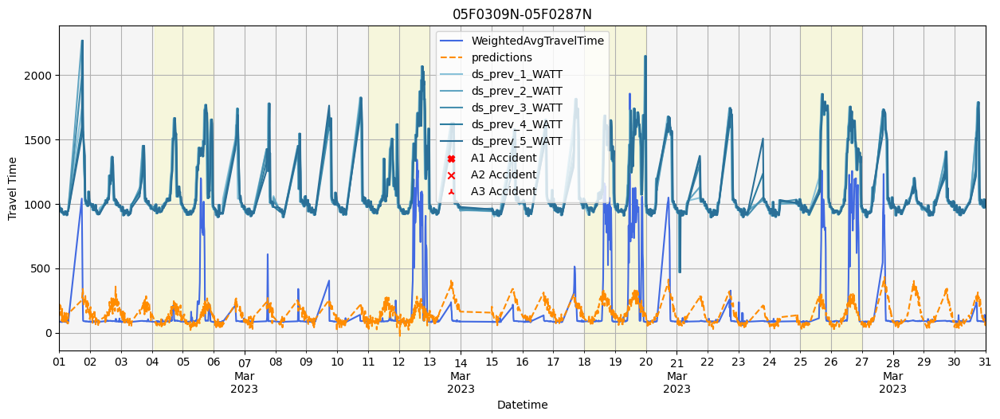

In [74]:
viz.plot_pred(filter_df, 'TSMixerx', '2023-03-01', '2023-03-31', enable_prev=True)

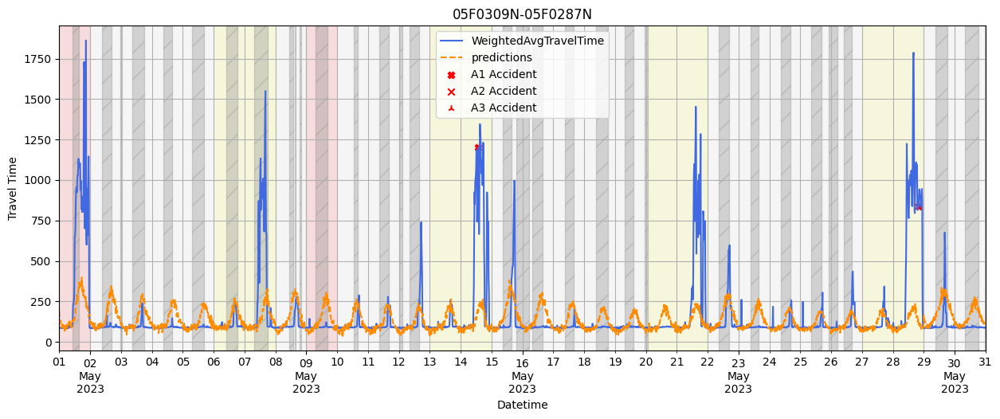

In [75]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-31')

從隨便抽出的時間範圍來看，道路施工挺頻繁的，但與旅行時間變長的狀況不相關

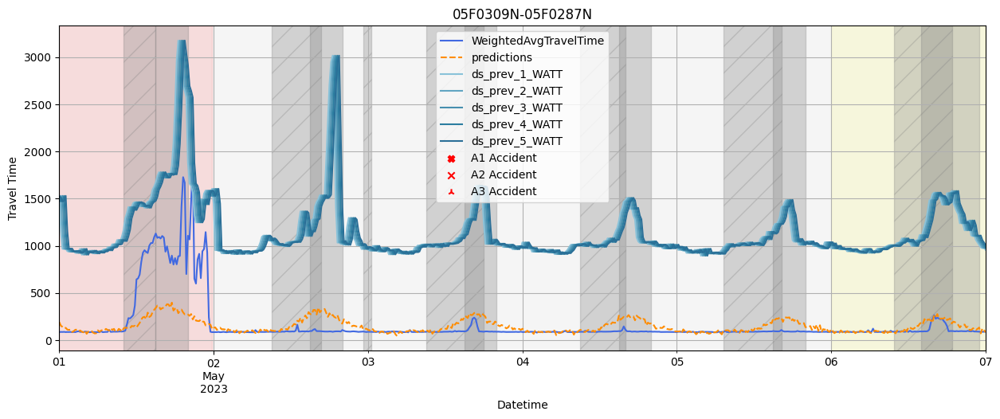

In [76]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

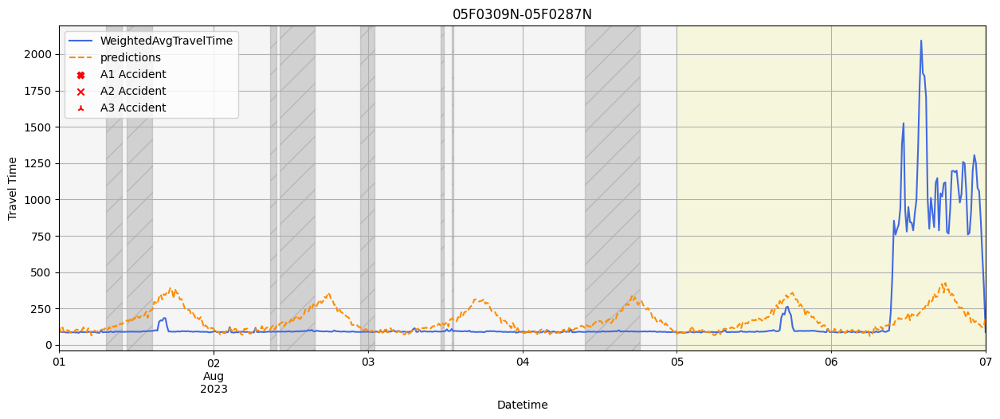

In [77]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

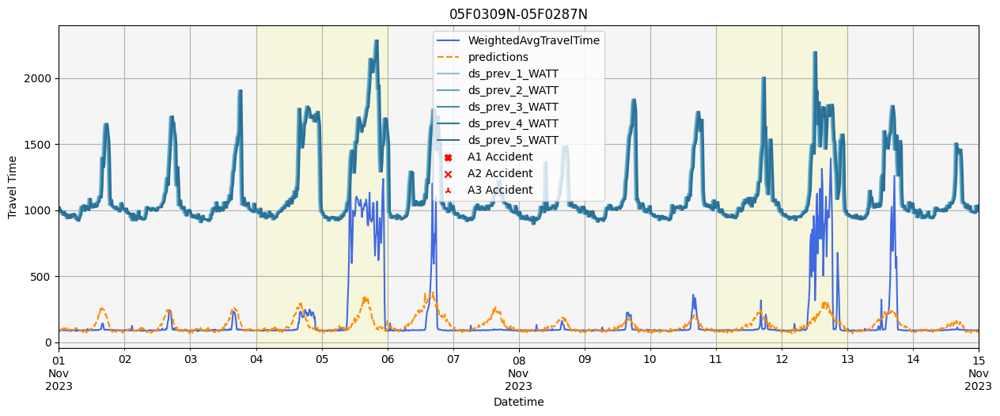

In [78]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [79]:
get_congestion_time(df)

dayofweek
1    1050
2    1050
3    1050
4    1050
5    1050
6    1502
7    2639
Name: ds, dtype: int64

雖然在資料中是有備標註到壅塞的觀測，但從資料的擬和上看來應該是下游的狀況比較高  
而在本路段看來，影響力應該是相對小一些

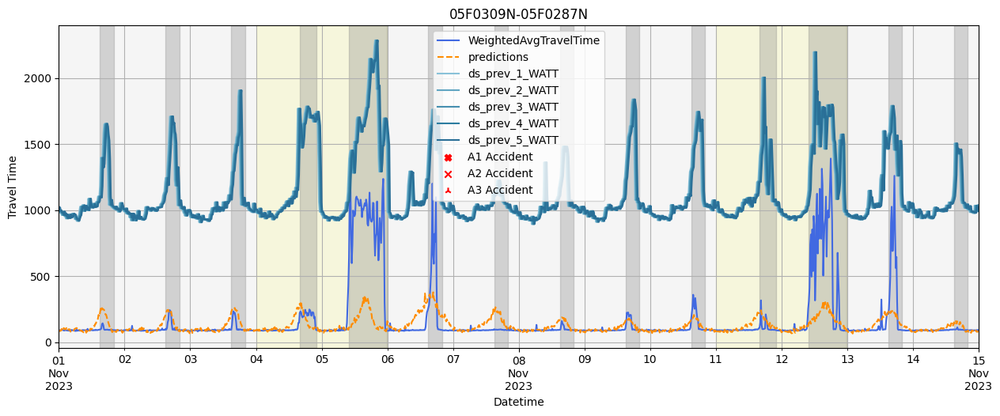

In [80]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True, enable_cong_label=True)

## holiday

對於節假日的影響難以獲取，但這是單變量且我們的訓練資料沒有超過一年，不太可能做到完美的擬和  

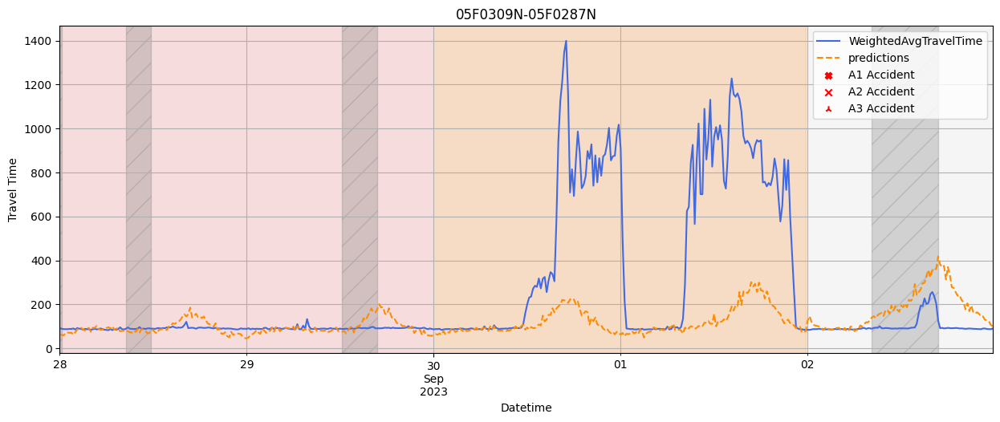

In [81]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

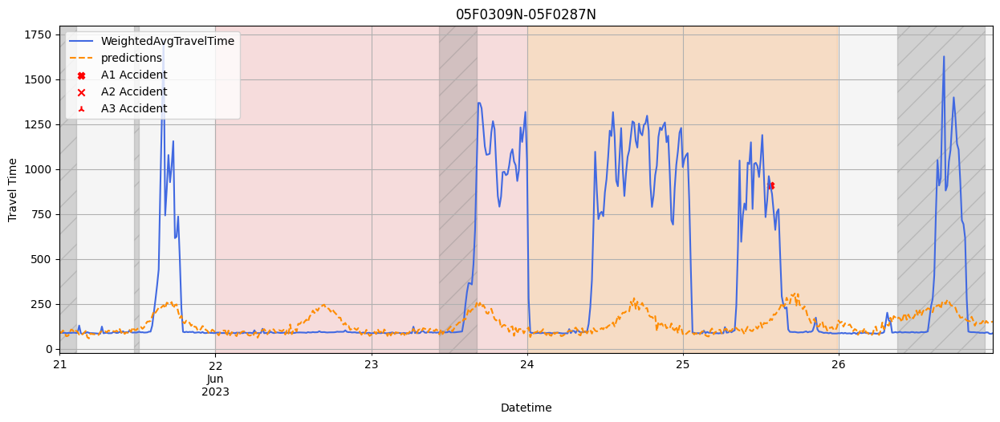

In [82]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

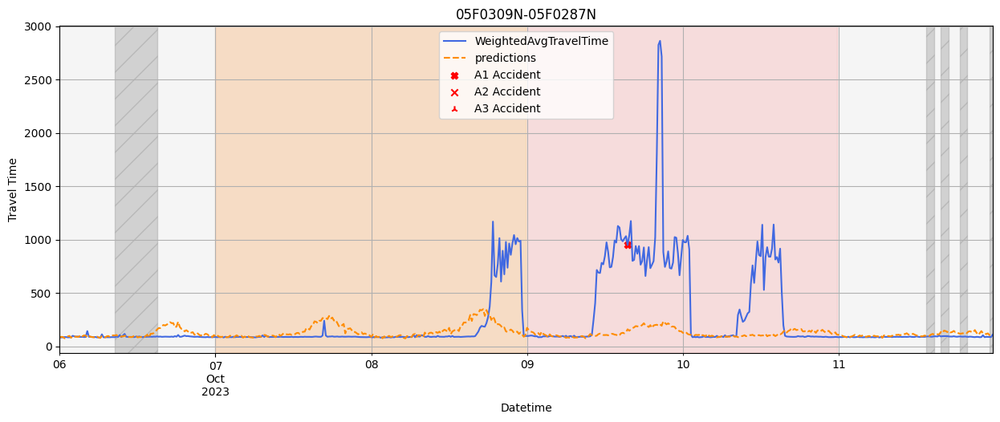

In [83]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

## traffic event

單變量本身無法應對突發狀況

In [84]:
get_accident_datetime(df)

,datetime,accident_type,ds
0,2023-01-24,1,1
1,2023-01-25,1,1
2,2023-01-26,1,2
3,2023-02-05,1,1
4,2023-03-21,1,2
5,2023-03-25,1,1
6,2023-04-03,1,1
7,2023-04-23,1,2
8,2023-05-14,1,1
9,2023-05-28,1,1


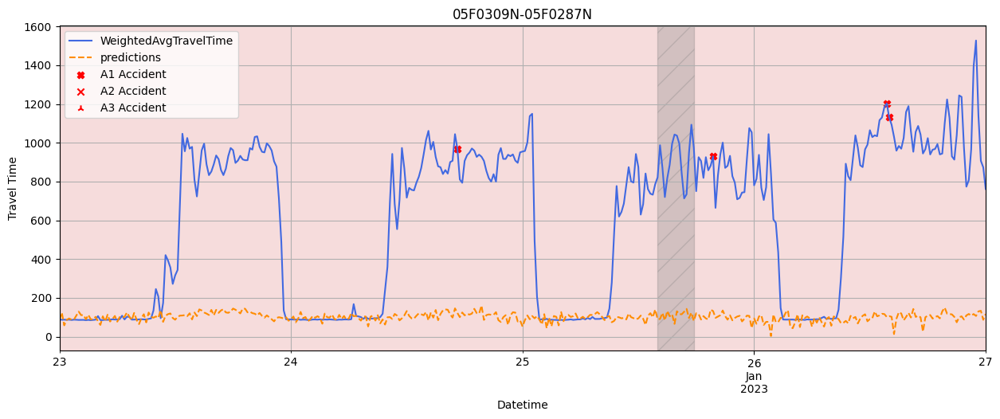

In [85]:
viz.plot_pred(df, 'TSMixerx', '2023-01-23', '2023-01-27')

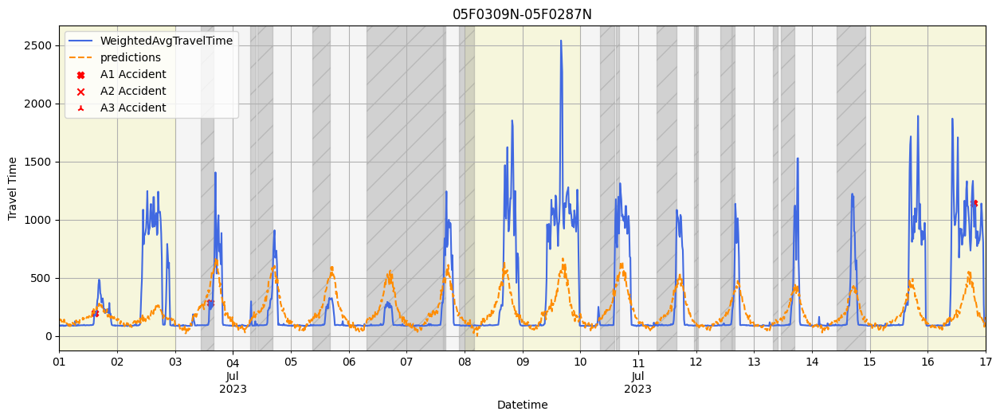

In [86]:
viz.plot_pred(df, 'TSMixerx', '2023-07-01', '2023-07-17')

# 05F0438N-05F0309N-TSMixerx

In [87]:
gantry_name = '05F0438N-05F0309N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,ds_prev_1_WATT,0.759552
1,ds_prev_5_WATT,0.052813
2,ds_prev_2_WATT,0.052423
3,ds_prev_4_WATT,0.038963
4,ds_prev_3_WATT,0.035965
5,dayofweek,0.023651
6,holiday_length,0.011445
7,congestion_syndrome,0.004481
8,holiday_name_端午節,0.003131
9,road_build,0.002596


使用TSMixerx模型進行訓練，並沒有用到選擇的27個特徵  
但我們可以觀察一下，在特徵重要性中下游的影響較大，後續則是節假日、道路維修以及壅塞的標記，交通事故的因子相當的微量  
最為顯著的應該還是下游的前15分鐘旅行時間有最強的影響力  
雖然沒有用到多變量的設定，但我們可以假設這個路段的對於上下游或是時間前後段關係存在影響  
而此神經網路的設計上應該是可以掌握與前段時間高度相關的趨勢性  

## normal days

In [88]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (26379, 67)
remove only traffic accident data shape = (33570, 67)
remove above condition to gain normal data shape = (22579, 67)


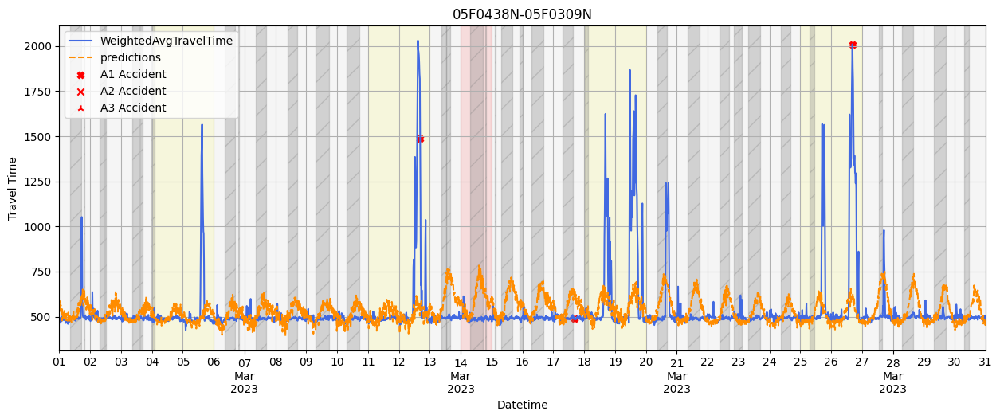

In [89]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

就三月的驗證資料看來，預測表現上不是那麼合適，TSMixerx會有一個相當大的波動存在，幅度達到1.5倍之多  

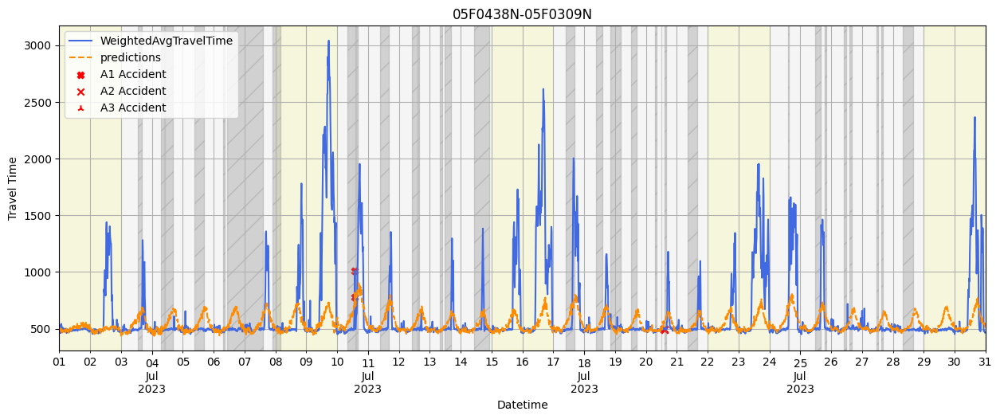

In [90]:
# July, normal condition only
viz.plot_pred(df, 'TSMixerx', '2023-07-01', '2023-07-31')

7月的資料中，旅行時間看起來是有點奇怪的，常會出現超過正常旅行時間1倍以上的情形出現  
灰色區塊所代表的施工時間對照旅行時間也不存在直接的關係  
事故發生的部分也無從觀察到顯著的因為事故而造成旅行時間延長  
我們可以對照下游的旅行時間做參照，而趨勢上看起來是有關聯的  

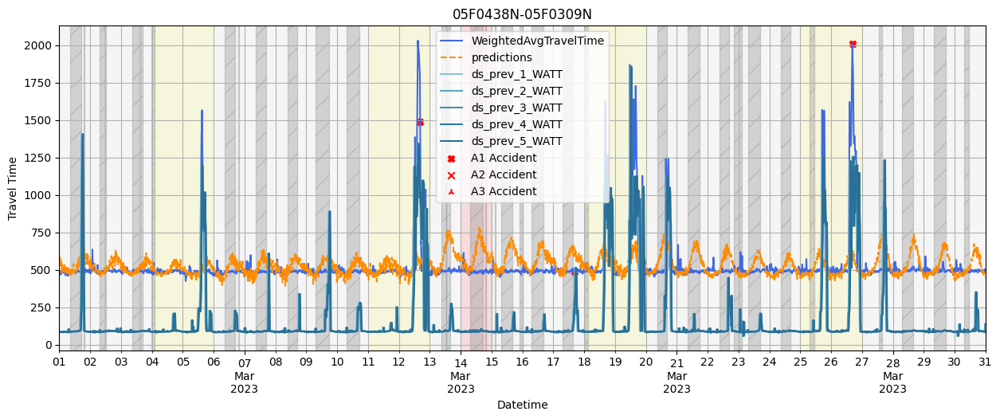

In [91]:
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31', enable_prev=True)

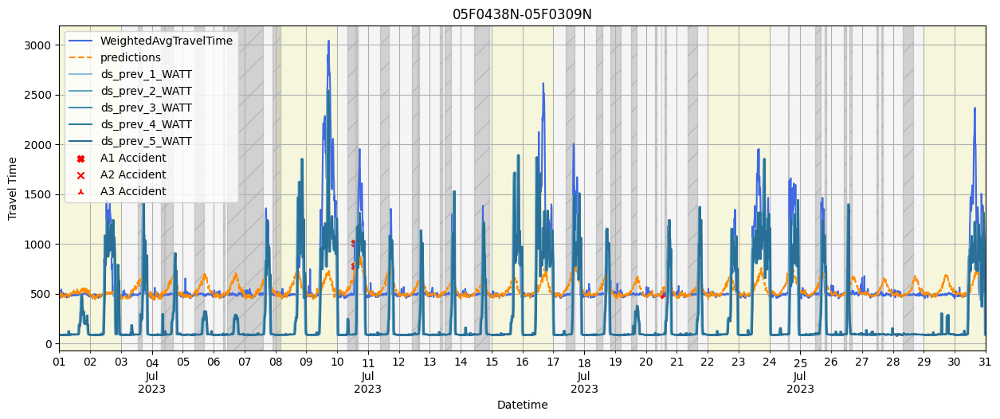

In [92]:
viz.plot_pred(df, 'TSMixerx', '2023-07-01', '2023-07-31', enable_prev=True)

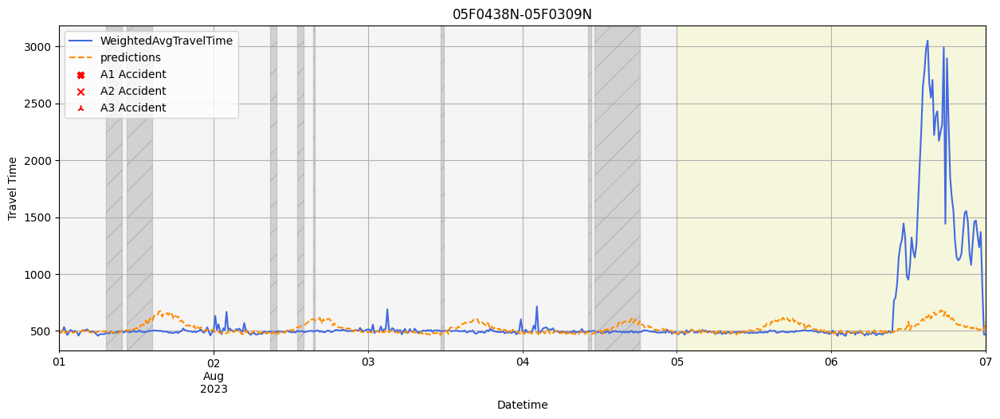

In [93]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

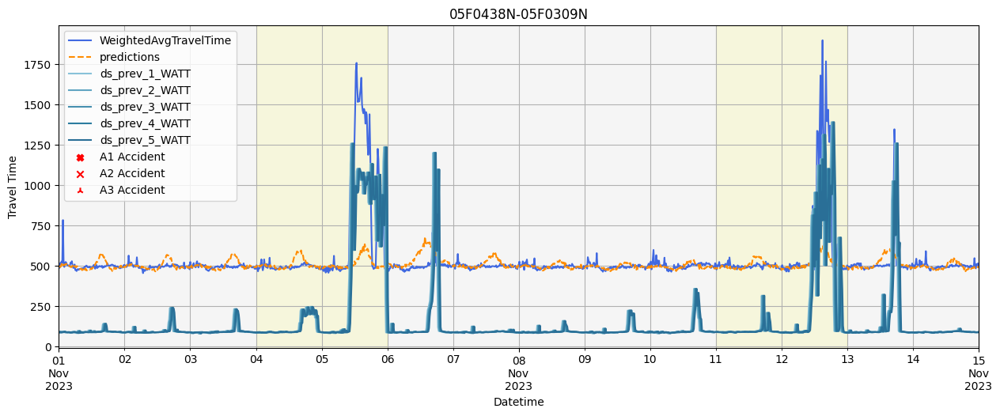

In [94]:
# November
viz.plot_pred(df, 'TSMixerx', '2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [95]:
get_congestion_time(df)

dayofweek
1    1050
2    1050
3    1050
4    1050
5    1050
6    1502
7    2639
Name: ds, dtype: int64

雖然在資料中是有備標註到壅塞的觀測，從結果看來影響不大

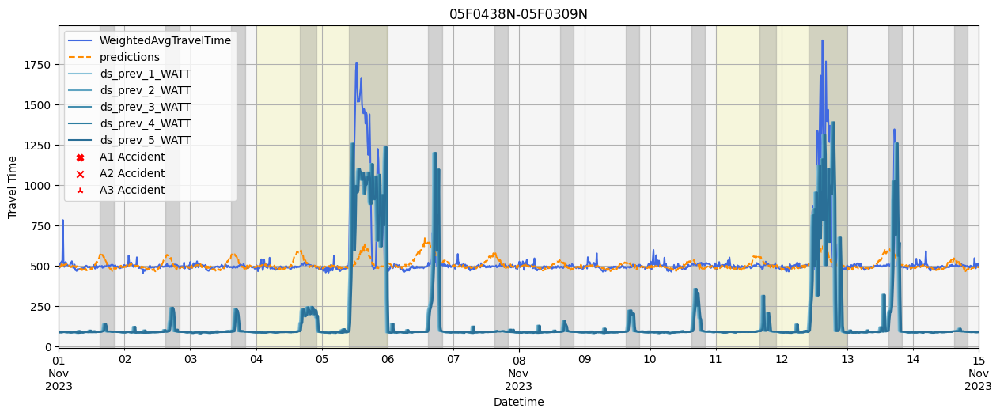

In [96]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_prev=True, enable_cong_label=True)

## holiday

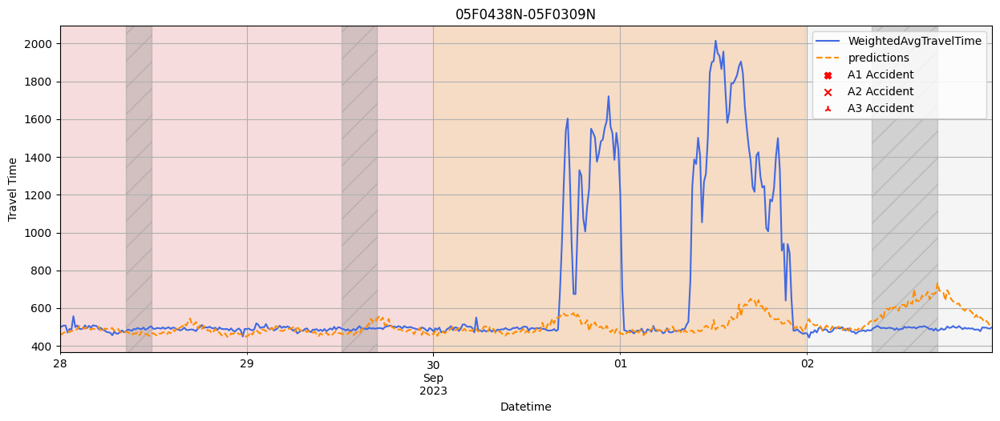

In [97]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

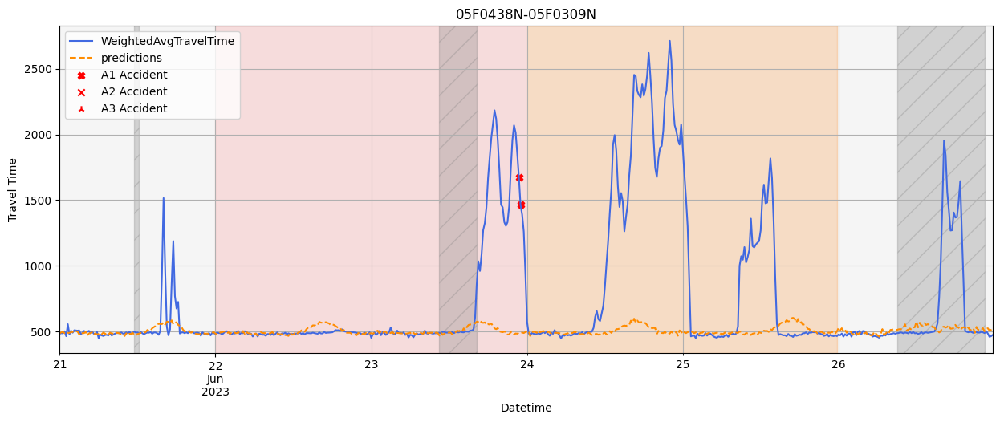

In [98]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

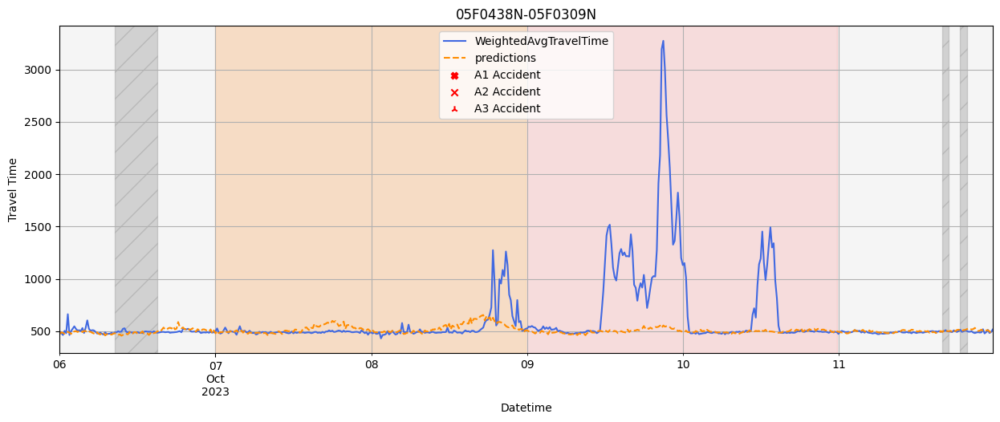

In [99]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

## traffic event

In [100]:
get_accident_datetime(df)

,datetime,accident_type,ds
0,2023-01-22,1,1
1,2023-02-11,2,3
2,2023-02-27,2,1
3,2023-03-12,1,1
4,2023-03-17,1,1
5,2023-03-26,1,1
6,2023-04-16,1,1
7,2023-06-23,1,2
8,2023-07-10,1,2
9,2023-07-20,2,5


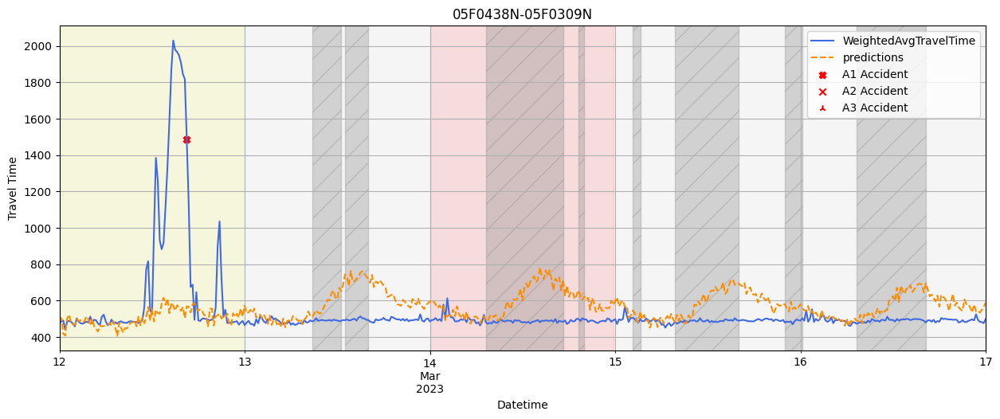

In [101]:
viz.plot_pred(df, 'TSMixerx', '2023-03-12', '2023-03-17')

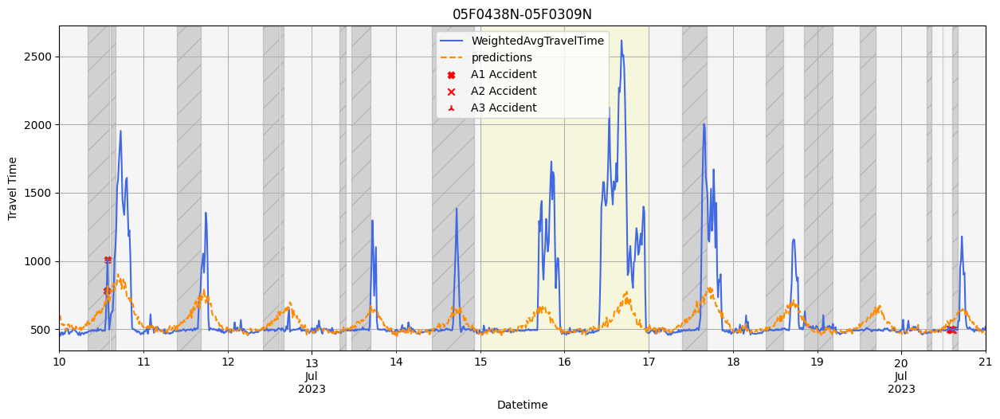

In [102]:
viz.plot_pred(df, 'TSMixerx', '2023-07-10', '2023-07-21')

綜合上述面相檢視後，推測這個路段不適合使用TSMixex或是其它我們在前段建模所用的任何方法  
因為從對交叉驗證的結果來看，成效不是太好(但是TSMixerx是其中最好的了)  

# 05F0438N-05FR143N-multivar-TSMixerx

In [104]:
gantry_name = '05F0438N-05FR143N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,road_build,0.419806
1,dayofweek,0.376563
2,holiday_length,0.055563
3,road_block_count,0.027151
4,holiday_name_農曆新年,0.017800
5,holiday_name_跨年元旦,0.017045
6,congestion_syndrome,0.016521
7,holiday_continue,0.016115
8,total_block_count,0.009573
9,holiday_name_端午節,0.009007


使用多變量的TSMixerx模型進行訓練，24個特徵被納入考慮，在特徵重要性中道路施工的影響較大，後續則是節假日、壅塞的標記  
值得一提，在建立模型時是沒有考慮到交通事故的影響的，在其他路段要納入相關因子難度很高  

## normal days

In [105]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (27418, 67)
remove only traffic accident data shape = (33600, 67)
remove above condition to gain normal data shape = (23610, 67)


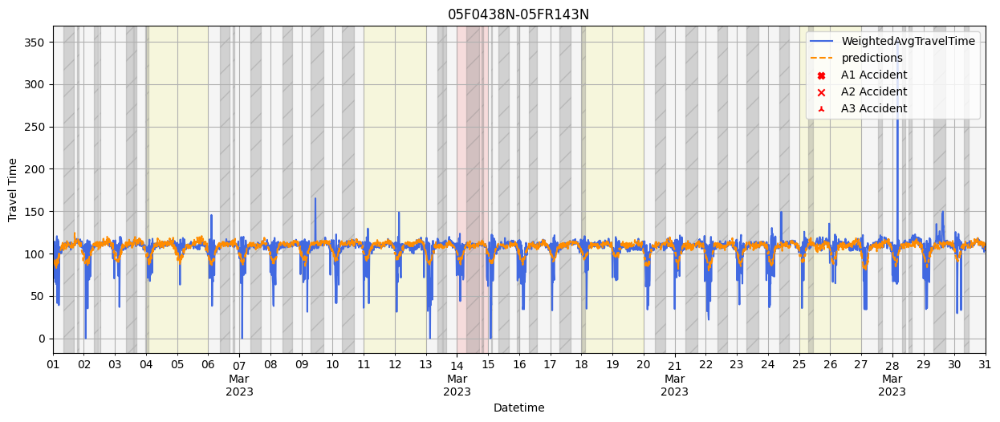

In [106]:
# March
viz.plot_pred(df, 'TSMixerx', '2023-03-01', '2023-03-31')

初步觀察旅行時間變異非常大，0~100之間不等，且在線段的閱讀上有一種密集感，可以知道應該是來回震盪幅度大導致的

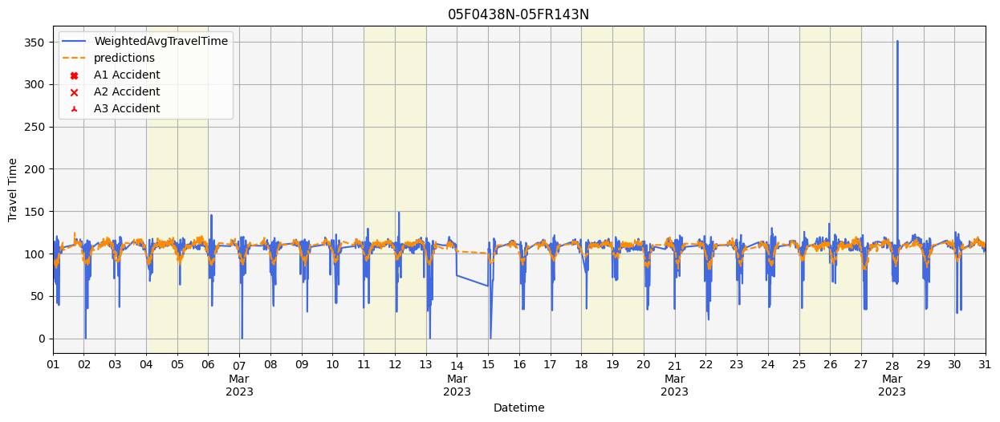

In [107]:
# March, normal condition only
viz.plot_pred(filter_df, 'TSMixerx', '2023-03-01', '2023-03-31')

gantrypair的旅行時間波動大，但他沒有可對照下游的旅行時間

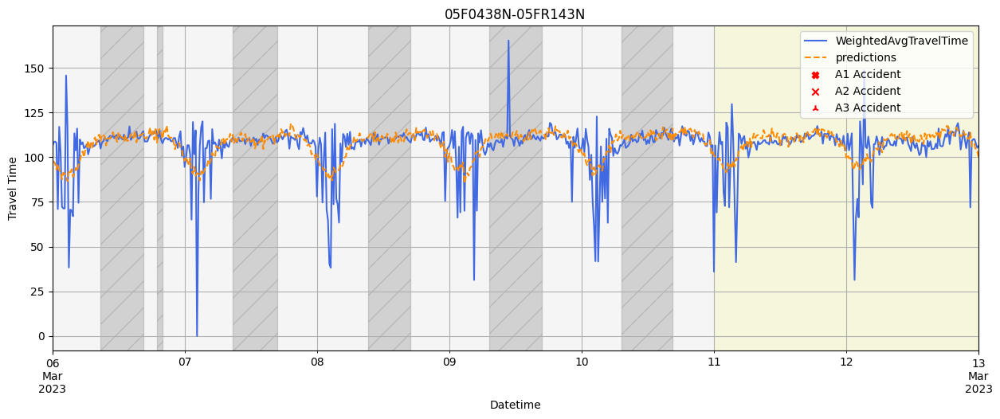

In [109]:
viz.plot_pred(df, 'TSMixerx', '2023-03-06', '2023-03-13')

最極端的狀況下甚至還有0，我們比對原始的資料中就會發現車流量不高，在凌晨時做得預測失真太多，因此可以解讀在這個gantry下旅行時間太容易受到單一個體的影響  
所以要能描繪到全日平均一點的旅行時間是有一定難度的  

In [110]:
filter_df[filter_df.ds.between('2023-03-07', '2023-03-08')][['ds', 'TotalTraffic']].head(20)

,ds,TotalTraffic
4800,2023-03-07 00:00:00,7.0
4801,2023-03-07 00:15:00,8.0
4802,2023-03-07 00:30:00,11.0
4803,2023-03-07 00:45:00,9.0
4804,2023-03-07 01:00:00,5.0
4805,2023-03-07 01:15:00,7.0
4806,2023-03-07 01:30:00,7.0
4807,2023-03-07 01:45:00,4.0
4808,2023-03-07 02:00:00,3.0
4809,2023-03-07 02:15:00,0.0


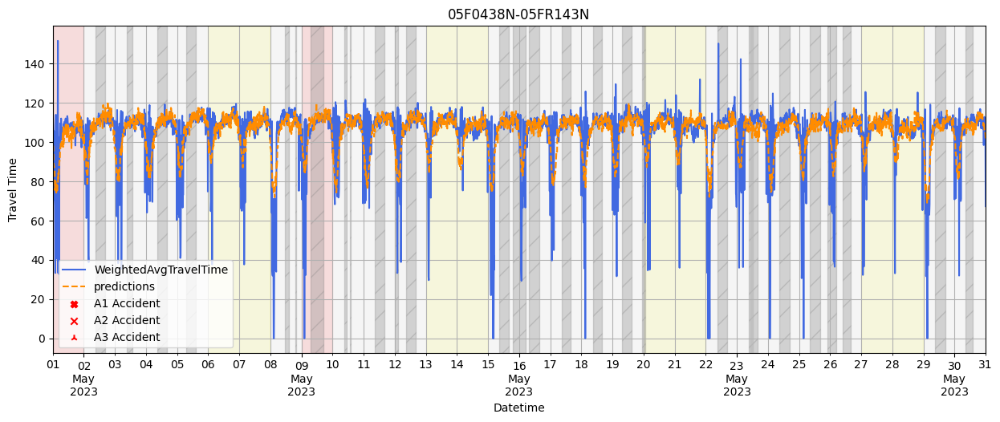

In [111]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-31')

從隨便抽出的時間範圍來看，道路施工挺頻繁的，但與旅行時間變長的狀況不能說直接相關

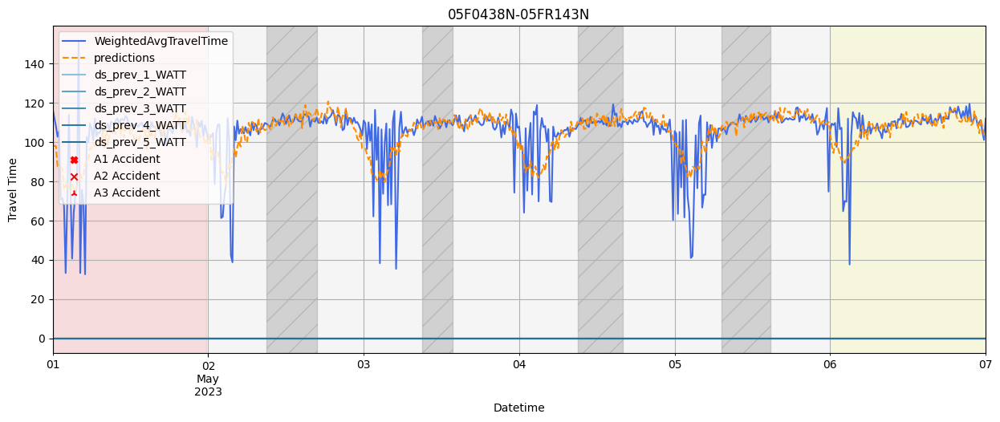

In [112]:
viz.plot_pred(df, 'TSMixerx', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

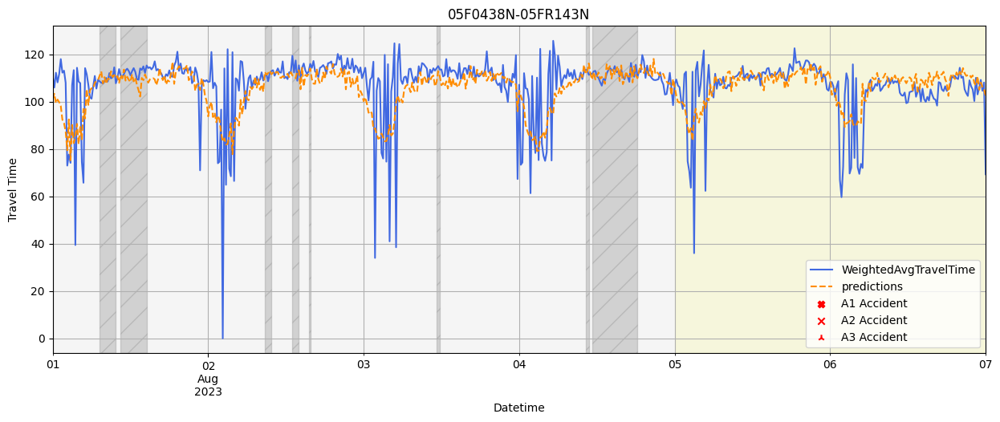

In [113]:
viz.plot_pred(df, 'TSMixerx', '2023-08-01', '2023-08-07')

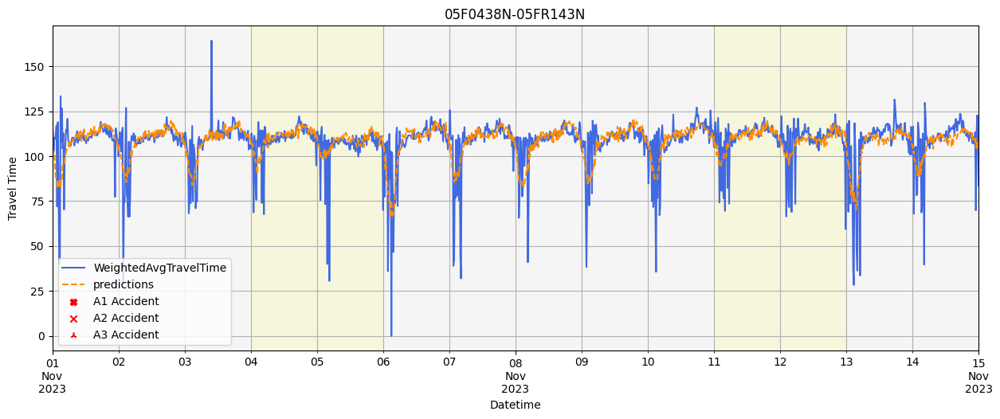

In [115]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15')

## congestion

In [116]:
get_congestion_time(df)

dayofweek
7    869
Name: ds, dtype: int64

雖然在資料中是有備標註到壅塞的觀測，但從資料的擬和上來看表現還可以

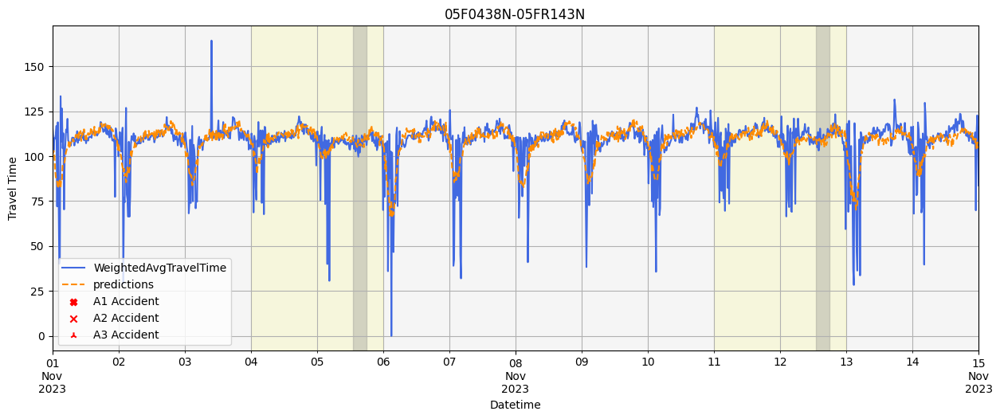

In [118]:
viz.plot_pred(df, 'TSMixerx' ,'2023-11-01', '2023-11-15', enable_cong_label=True)

## holiday

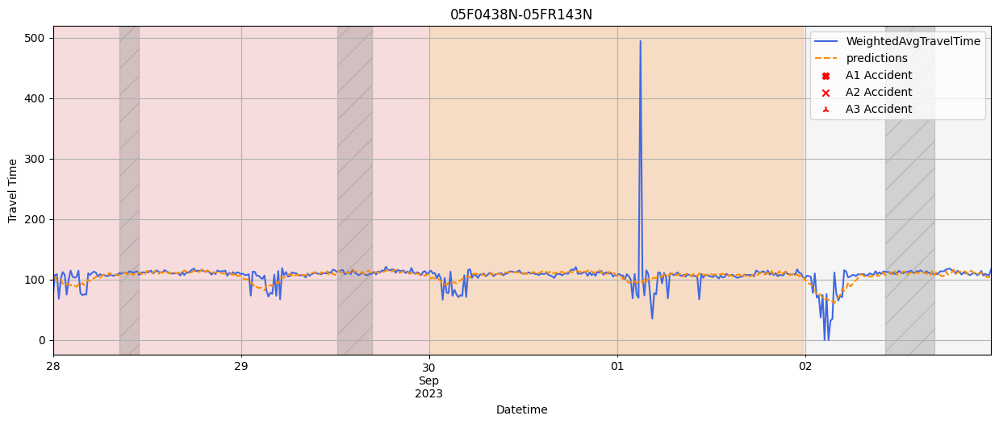

In [119]:
viz.plot_check_holiday(df, 'TSMixerx', '中秋節', ext_time=1)

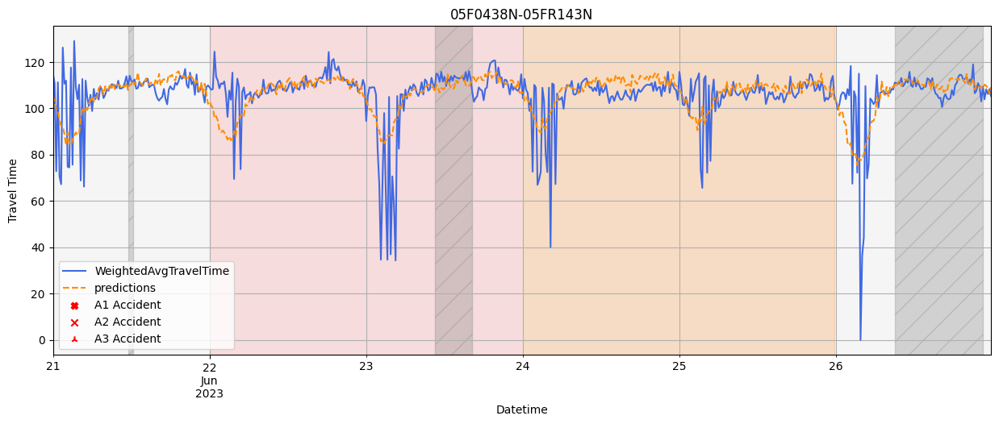

In [120]:
viz.plot_check_holiday(df, 'TSMixerx', '端午節', ext_time=1)

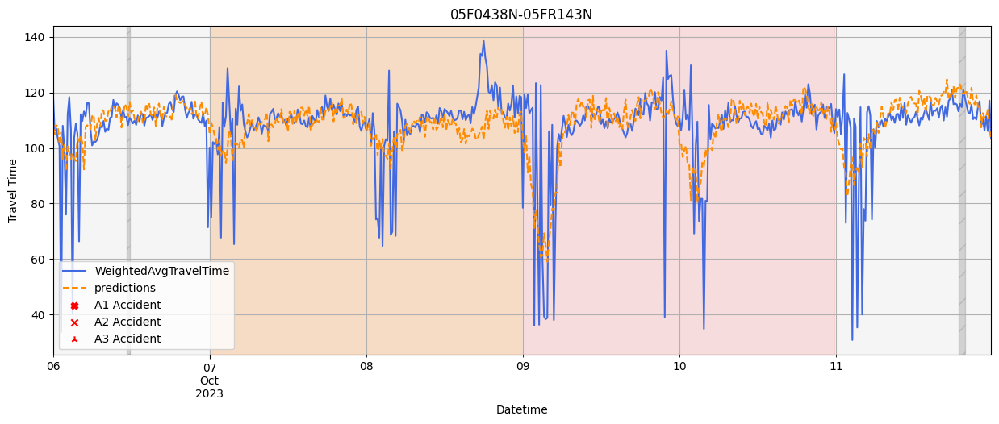

In [121]:
viz.plot_check_holiday(df, 'TSMixerx', '國慶日', ext_time=1)

在特殊節假日上來看，這個路段沒有太大的差異，也許是幾何型態上簡單很多導致的，這塊需要更進一步透過其他資料來佐證  
但單論節假日的驗證上效果不錯  

## traffic event

In [122]:
get_accident_datetime(df)

,datetime,accident_type,ds


就結果看來，此路段沒有發生過事故，特徵中也沒有特別納入事故的因子  

# 05F0528N-05F0438N-PatchTST

In [123]:
gantry_name = '05F0528N-05F0438N'
df = f_results[gantry_name].copy()
feature_importance[gantry_name]

,feature,importance
0,ds_prev_1_WATT,0.218612
1,ds_prev_3_WATT,0.177002
2,ds_prev_2_WATT,0.174134
3,ds_prev_4_WATT,0.169792
4,ds_prev_5_WATT,0.167829
5,dayofweek,0.047136
6,holiday_length,0.013684
7,holiday_continue,0.005498
8,road_build,0.004712
9,road_block_count,0.003497


在前面的特徵工程環節，根據門檻取出了29個特徵，特徵重要性中以下游的影響較大，後續則是節假日、道路維修以及壅塞的標記  
但驗證後，最終採納的是PatchTST進行單變量的模型訓練結果  

## normal days

In [124]:
filter_df = remove_special_condi(df)

original data shape = (33600, 67)
remove only holiday data shape = (29376, 67)
remove only road build data shape = (27289, 67)
remove only traffic accident data shape = (33598, 67)
remove above condition to gain normal data shape = (23521, 67)


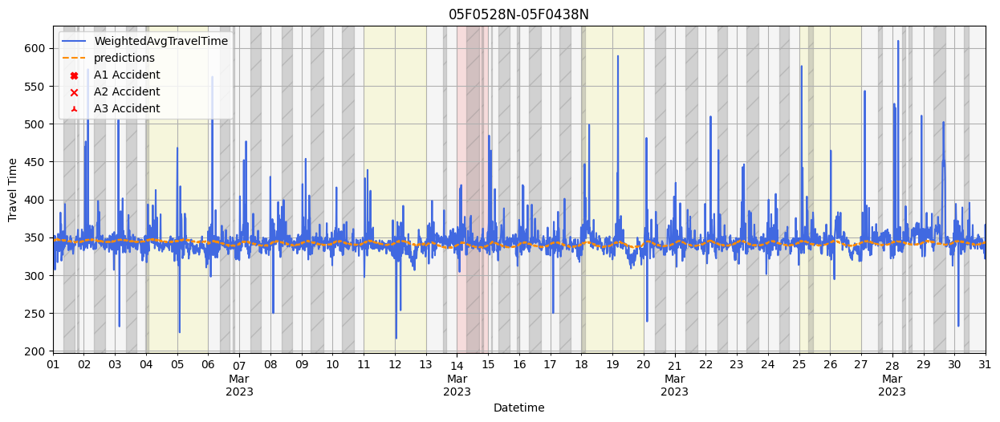

In [125]:
# March
viz.plot_pred(df, 'PatchTST', '2023-03-01', '2023-03-31')

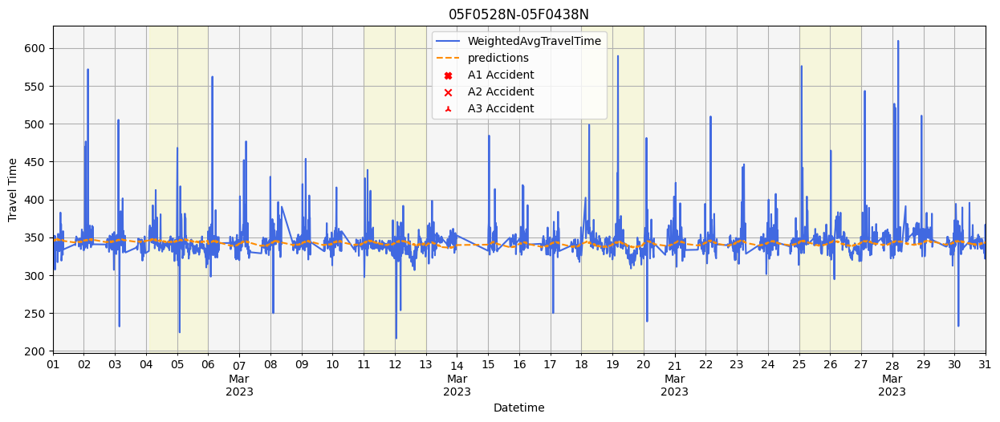

In [126]:
# March, normal condition only
viz.plot_pred(filter_df, 'PatchTST', '2023-03-01', '2023-03-31')

這個gantry的旅行時間看起來波動大，我們可以對照下游的旅行時間做參照，趨勢上看起來是有關聯的

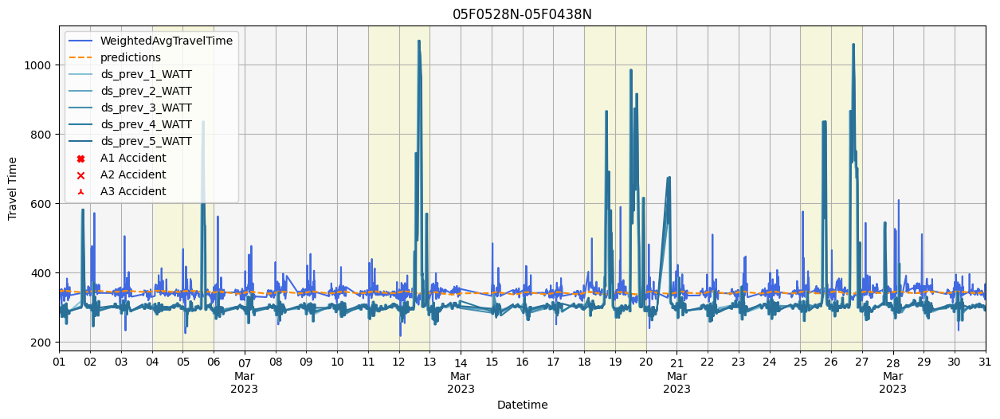

In [127]:
viz.plot_pred(filter_df, 'PatchTST', '2023-03-01', '2023-03-31', enable_prev=True)

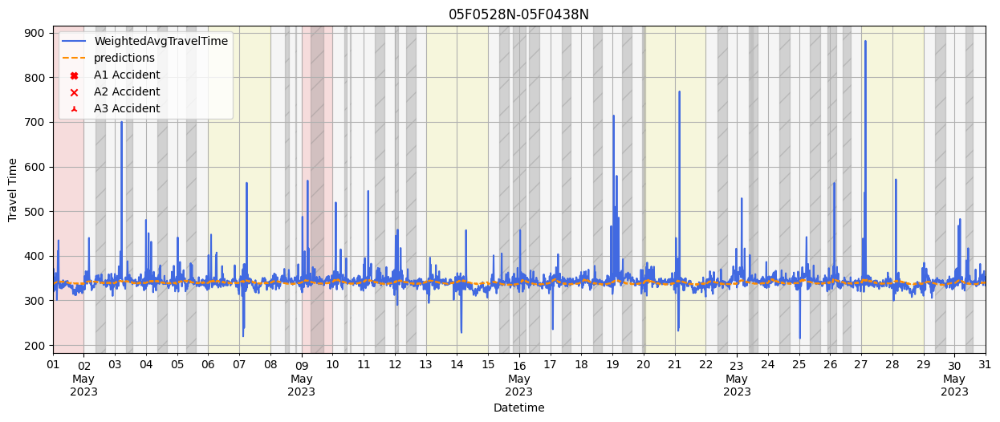

In [128]:
viz.plot_pred(df, 'PatchTST', '2023-05-01', '2023-05-31')

從隨便抽出的時間範圍來看，道路施工挺頻繁的，但與旅行時間變長的狀況不相關  
PatchTST的預測上跟TSMixerx的差異很大，以平穩著稱  

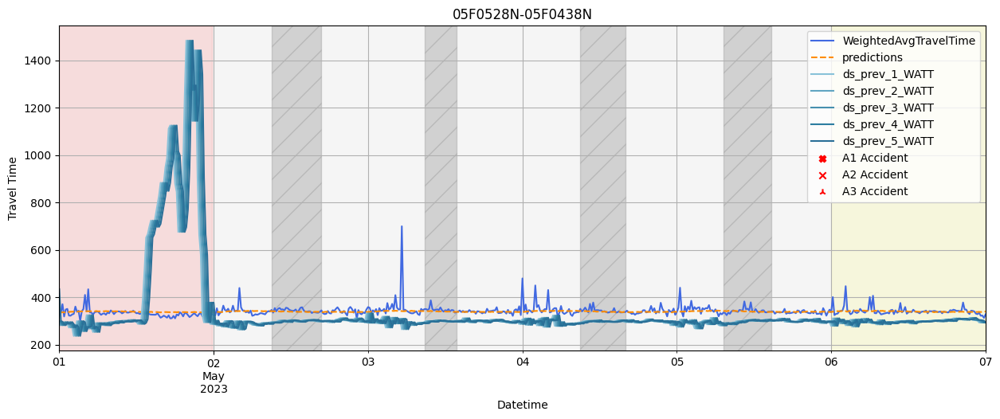

In [129]:
viz.plot_pred(df, 'PatchTST', '2023-05-01', '2023-05-07', enable_cong_label=True, enable_prev=True)

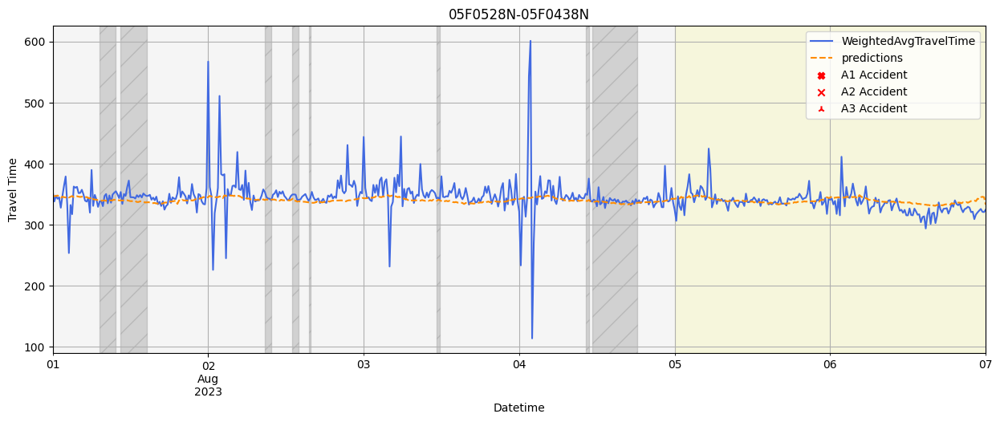

In [130]:
viz.plot_pred(df, 'PatchTST', '2023-08-01', '2023-08-07')

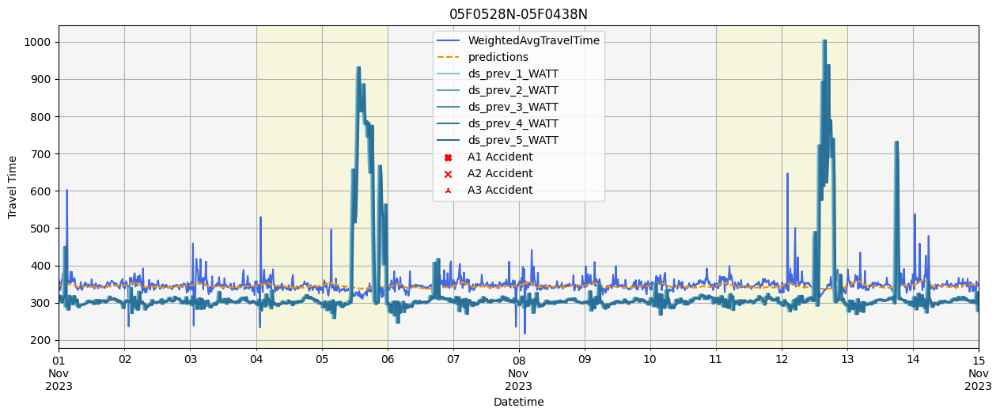

In [131]:
viz.plot_pred(df, 'PatchTST' ,'2023-11-01', '2023-11-15', enable_prev=True)

## congestion

In [132]:
get_congestion_time(df)

dayofweek
7    869
Name: ds, dtype: int64

雖然在資料中是有備標註到壅塞的觀測，但從資料的擬和上看來應該是下游的狀況比較高

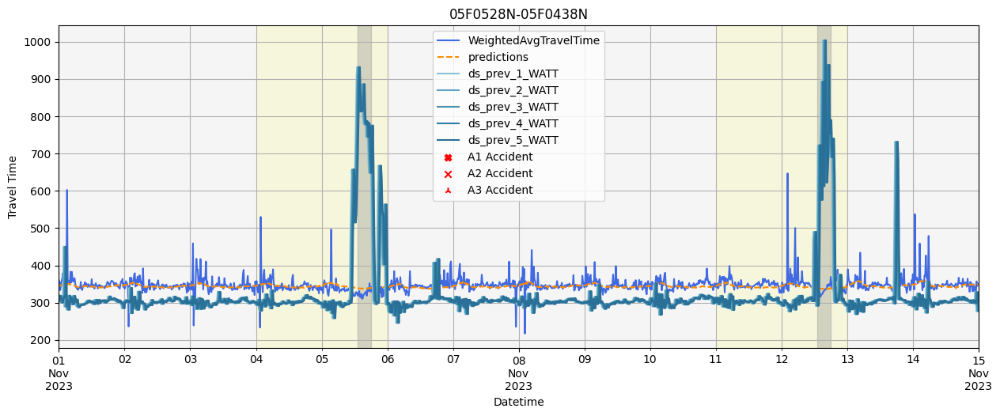

In [133]:
viz.plot_pred(df, 'PatchTST' ,'2023-11-01', '2023-11-15', enable_prev=True, enable_cong_label=True)

## holiday

因為PatchTST過於平穩，且是單變量建模下  
我們可預期再針對突發或是特例的事件上表現應該不會太好  

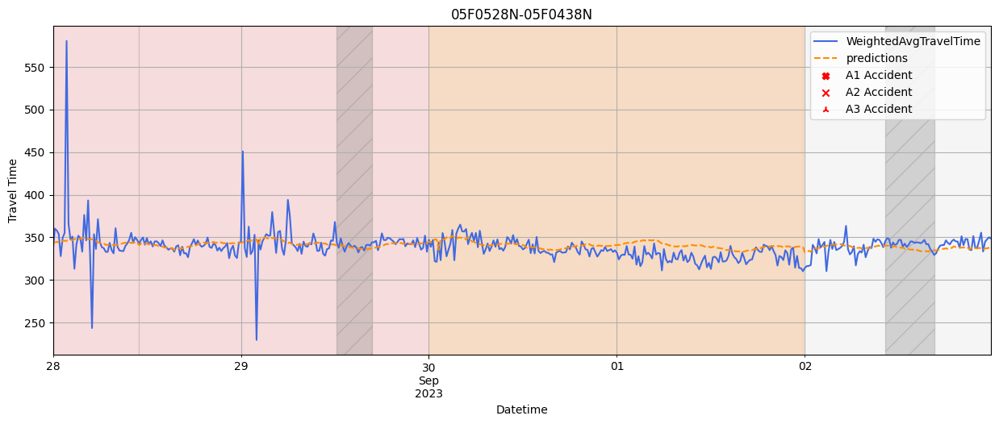

In [134]:
viz.plot_check_holiday(df, 'PatchTST', '中秋節', ext_time=1)

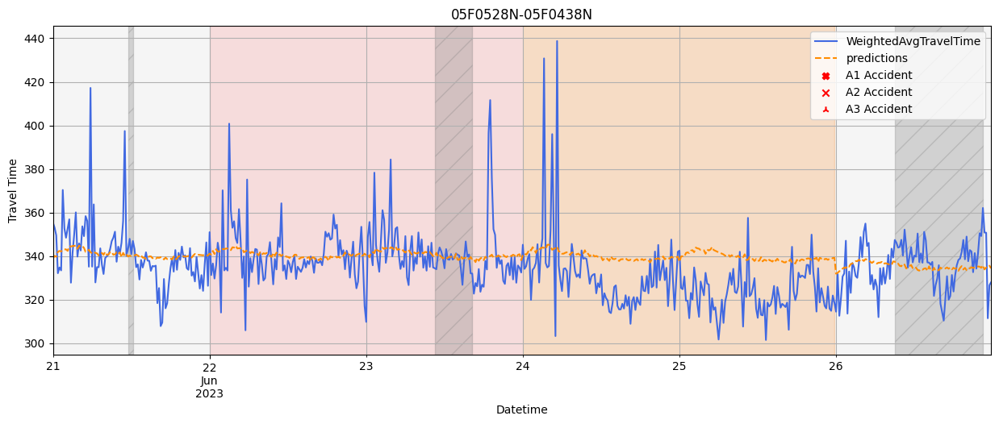

In [135]:
viz.plot_check_holiday(df, 'PatchTST', '端午節', ext_time=1)

端午節後的周六周日應該是因為連假關係，預測的曲線在某些段落就高過實際狀況太多了

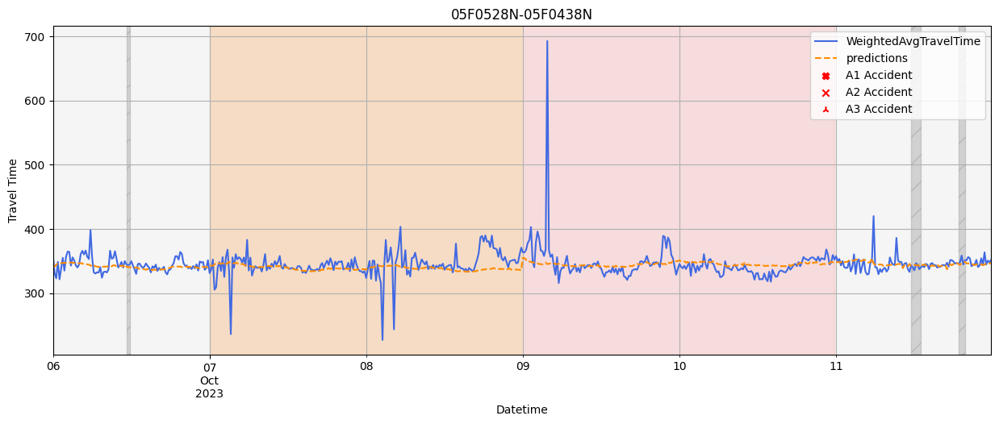

In [136]:
viz.plot_check_holiday(df, 'PatchTST', '國慶日', ext_time=1)

## traffic event

In [137]:
get_accident_datetime(df)

,datetime,accident_type,ds
0,2023-06-12,1,1
1,2023-07-02,1,1


就結果看來，此路段不太常發生事故，歷史資料中發生的事故對於旅行時間影響微乎其微    
影響不大  

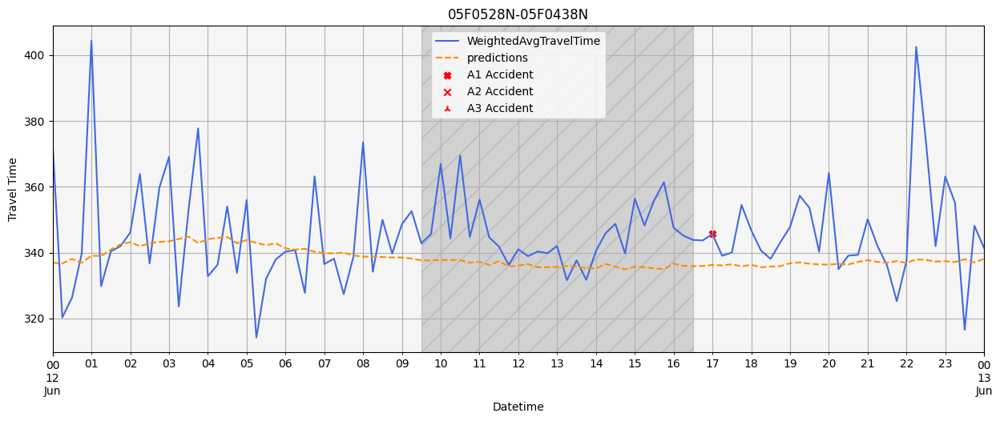

In [138]:
viz.plot_pred(df, 'PatchTST', '2023-06-12', '2023-06-13')

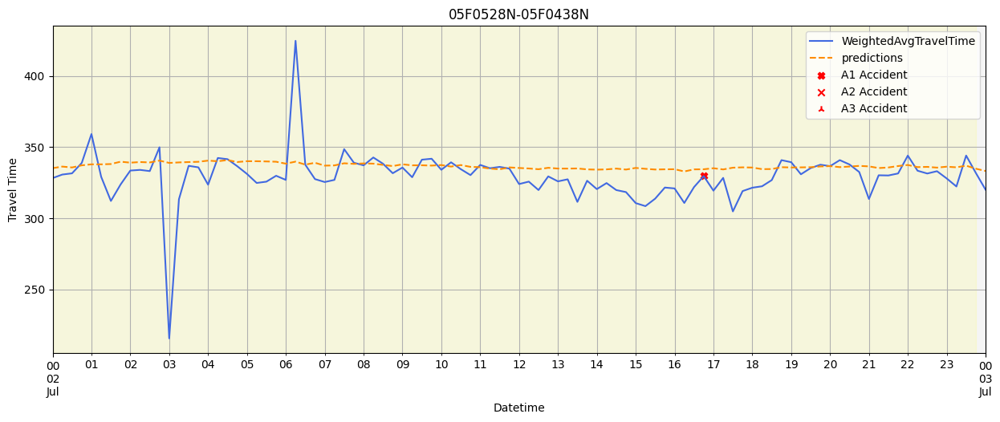

In [139]:
viz.plot_pred(df, 'PatchTST', '2023-07-02', '2023-07-03')

# Summary

以下總結一下本次專案研究的各模型成果:  
* 05F0001N-03F0150N-PatchTST: 表現不錯，無法應對節日
* 05F0001N-03F0201S-multivar-TSMixerx: 效果好，節日應對上有預警效果
* 05F0055N-05F0001N-multivar-TSMixerx: 效果好
* 05F0287N-05F0055N-multivar-TSMixerx: 效果好，節日應對上有預警效果
* 05F0309N-05F0287N-TSMixerx: 落差大，勉強
* 05F0438N-05F0309N-TSMixerx: 落差大，不適合
* 05F0438N-05FR143N-multivar-TSMixerx: 效果好，但凌晨的旅行時間受限於資料稀疏性有部分異常
* 05F0528N-05F0438N-PatchTST: 落差稍大，勉強

我們操作過了baseline, 單變量的神經網路, 多變量的神經網路搭配特徵工程與篩選，最終所決定的模型成果與交叉驗證的檢視  
8個gantry pair中有5個路段的時間序列預測表現上還不錯，從大致的結果看來增加變數搭配適合的模型在預測上的成績不會太差  
而TSMixerx這個系列的神經網路模型從諸多結果看來更為細緻  

原本預期模型能多加考慮到車禍或是異常事件等因子來優化預測能力，但這類事件終究是少數  
其影響程度在特徵工程階段就會被往後排，甚至毫無影響力  
也有部分路段在模型比較與競爭結果下，採用單變量比多變量有好的成果，這說明了以我們前面這樣操作下來的流程應該還有機會再做優化  
以下有幾個是我推測的主因:

1. 各gantry的幾何狀態不一樣
2. 路段的主要旅次目的可能不同  
3. 車禍所在位置影響整體路段旅行時間的範圍太大了，用etag資料可能不是那麼好的精準捕捉

因此如果想要特別做一個應對各種事件跟影響的預測模型，得另外採納不同的方式建立模型並組裝  
舉例，如果我們想要也把事故這類型的應對發揮得更好，可能得特地把車禍的前後時間變化跟所有因子拉出來做成獨立的預測模型  
驗證時再放到各個地點下去作為輔助，可能會比直接納入一個總體的模型中進行應用來的更有效  
只是擴展上就更需要借重交通、車流理論等專業知識的考慮  